# Preparando ambiente

In [1]:
!pip install sktime mlflow alibi alibi-detect -q

# Imports

In [1]:
# General
import json
import os

# Data transformation
import pandas as pd
import numpy as np
from sktime.split import temporal_train_test_split

# Data visualization
import matplotlib.pyplot as plt
from IPython.display import HTML
import seaborn as sns
from sktime.utils.plotting import plot_series

# Data quality
import alibi
from alibi_detect.cd import TabularDrift, KSDrift
from alibi_detect.saving import save_detector, load_detector

# Forecasting
from sktime.forecasting.fbprophet import Prophet
from sktime.forecasting.base import ForecastingHorizon
from sktime.transformations.series.boxcox import LogTransformer
from sktime.forecasting.model_selection import ForecastingGridSearchCV
from sktime.performance_metrics.forecasting import MeanSquaredError

# Model versioning
import mlflow
from sktime.utils.mlflow_sktime import (
    save_model,
    log_model,
    load_model,
    pyfunc
)

/Users/epitacioneto/Documents/UNIESP/hackathon-uniesp/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.
None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


# Leitura dos arquivos

In [6]:
import os 

os.getcwd()

'/Users/epitacioneto/Documents/UNIESP/hackathon-uniesp/notebooks'

In [7]:
pedidos = pd.read_csv('/Users/epitacioneto/Documents/UNIESP/hackathon-uniesp/data/raw/log_gprint_ops.csv', sep=';')
vendedores = pd.read_csv('/Users/epitacioneto/Documents/UNIESP/hackathon-uniesp/data/raw/ped_vendedoresgprint.csv', sep=';')
meta = pd.read_csv('/Users/epitacioneto/Documents/UNIESP/hackathon-uniesp/data/raw/meta_serie_anual_vendedors.csv', sep=';')

/var/folders/0t/qy18gfzj29b1ksf_lrdq30000000gn/T/ipykernel_8223/2183751851.py:1: DtypeWarning: Columns (11,22,23) have mixed types. Specify dtype option on import or set low_memory=False.
  pedidos = pd.read_csv('/Users/epitacioneto/Documents/UNIESP/hackathon-uniesp/data/raw/log_gprint_ops.csv', sep=';')


# Realizamos algumas conversões e limpeza de dados

In [8]:
vendedores = vendedores.rename(columns={'idGPrint': 'codVendedor'})
meta['venda_valor'] = meta['venda_valor'].str.replace(',', '.').astype('float64')

# Join entre pedidos e vendedores

In [9]:
df_merged = pd.merge(pedidos, vendedores, on='codVendedor')
df_merged.head()

,numCalc,codOP,serieOP,numOP,statusOP,statusOPSig,margLucro,margContrib,valorUnit,valorVenda,...,quantidadeEmbaladaEst,pendenciaDataCard,opEstoque,created_at,updated_at,idUsuarioSIG,cidade,UF,regiao,status
0,870426,154272,NaN,128908,ENCERRADO,ABERTO,0,"45,6629",0,"1999,8",...,0,0,0,2023-09-18 17:45:55,2023-10-03 12:20:45,60.0,João Pessoa,PB,JPAI,ATIVO
1,872923,159435,NaN,132893,ENCERRADO,ABERTO,"7,96237","34,8435","6,46154",8400,...,0,0,0,2023-09-18 17:45:55,2024-11-25 20:31:28,58.0,João Pessoa,PB,JPAI,ATIVO
2,880324,155865,NaN,130151,ENCERRADO,ABERTO,"19,2375","44,0912","9,3",5580,...,0,0,0,2023-09-18 17:45:55,2023-10-03 16:29:25,85.0,João Pessoa,PB,JPAE,ATIVO
3,885418,154188,NaN,128840,ENCERRADO,ABERTO,"10,0339","24,7519","0,15",12900,...,0,0,0,2023-09-18 17:45:55,2023-10-03 13:18:43,58.0,João Pessoa,PB,JPAI,ATIVO
4,885419,154312,NaN,128941,ENCERRADO,ABERTO,"11,882","38,1055","2,3",2300,...,0,0,0,2023-09-18 17:45:55,2023-10-03 13:18:43,58.0,João Pessoa,PB,JPAI,ATIVO


# Filtramos apenas para usuários com status ativo

In [10]:
df = df_merged[df_merged['status'] == 'ATIVO']

# Início do preparo para forecast

# Transformando a data hora do cadastro e id de usuário como index, e ordenamos

In [11]:
df['dataHoraPrimeiroCadastro'] = pd.to_datetime(df['dataHoraPrimeiroCadastro'])
df = df.set_index(['idUsuarioSIG', 'dataHoraPrimeiroCadastro']).sort_index()

/var/folders/0t/qy18gfzj29b1ksf_lrdq30000000gn/T/ipykernel_8223/2560610208.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dataHoraPrimeiroCadastro'] = pd.to_datetime(df['dataHoraPrimeiroCadastro'])


# Convertendo a coluna valorVenda para float

In [12]:
df['valorVenda'] = df['valorVenda'].str.replace(',', '.').astype('float64')

# Plot do histórico de vendas dos vendedores

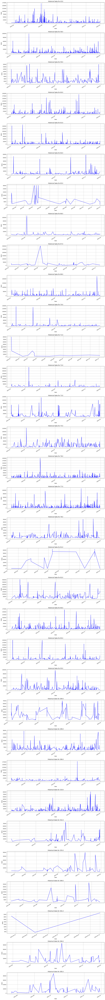

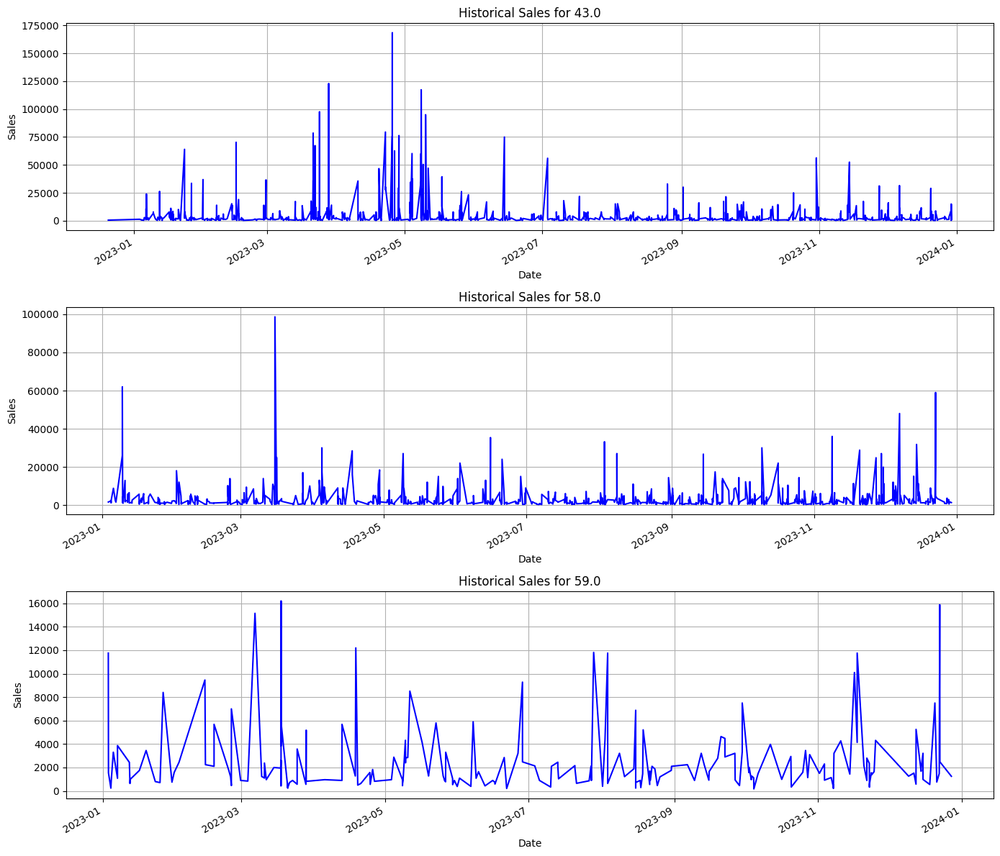

In [9]:
def plot_vendor_histories(df, n_vendors_to_plot=None):
    """
    Plot historical sales for each vendor individually.

    Parameters:
    - df: DataFrame with multi-index (vendor_code, date)
    - n_vendors_to_plot: Number of vendors to plot (None for all)
    """
    vendor_codes = df.index.get_level_values(0).unique()

    if n_vendors_to_plot is not None:
        vendor_codes = vendor_codes[:n_vendors_to_plot]

    n_vendors = len(vendor_codes)
    fig, axes = plt.subplots(n_vendors, 1, figsize=(14, 4*n_vendors))

    if n_vendors == 1:
        axes = [axes]

    for i, vendor in enumerate(vendor_codes):
        vendor_data = df.xs(vendor, level=0)

        ax = axes[i]
        vendor_data['valorVenda'].plot(ax=ax, color='blue')

        ax.set_title(f'Historical Sales for {vendor}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Sales')
        ax.grid(True)

    plt.tight_layout()
    plt.show()

plot_vendor_histories(df)
plot_vendor_histories(df, n_vendors_to_plot=3)  # Plot first 3 vendors

# Funções de apoio

In [23]:
def validate_forecast(y_pred, lower, upper, vendor_id):
    checks = {
        "No NaN values": lambda: not y_pred.isnull().any(),
        "No infinite values": lambda: not np.isinf(y_pred).any(),
        "Positive values": lambda: y_pred.min() >= 0,
        "Valid CIs": lambda: (upper >= lower).all(),
        "Non-empty": lambda: len(y_pred) > 0
    }

    failed = [name for name, check in checks.items() if not check()]
    if failed:
        print(f"Validation failed for {vendor_id}: {', '.join(failed)}")
        return False
    return True

In [16]:
def plot_actual_vs_predicted(forecast_data, actual, predicted, title="Actual vs Predicted"):
    """Helper function to plot actual vs predicted values"""
    plt.figure(figsize=(12, 6))

    plot_series(
        actual,
        predicted,
        labels=["Actual", "Predicted"],
        title=title
    )
    plt.fill_between(
        forecast_data['y_pred'].index,
        forecast_data['lower_ci'],
        forecast_data['upper_ci'],
        color='blue',
        alpha=0.2,
        label='95% Confidence Interval'
    )
    plt.show()

In [17]:
def plot_vendor_forecasts(historical_data, forecasts_dict, n_vendors_to_plot=None):
    """
    Plot historical data and forecasts for each vendor.

    Parameters:
    - historical_data: Original DataFrame with multi-index (vendor_code, date)
    - forecasts_dict: Dictionary of forecasts from vendor_forecasts
    - n_vendors_to_plot: Number of vendors to plot (None for all)
    """
    vendor_codes = list(forecasts_dict.keys())

    if n_vendors_to_plot is not None:
        vendor_codes = vendor_codes[:n_vendors_to_plot]

    n_vendors = len(vendor_codes)
    fig, axes = plt.subplots(n_vendors, 1, figsize=(14, 5*n_vendors))

    if n_vendors == 1:
        axes = [axes]

    for i, vendor in enumerate(vendor_codes):
        vendor_history = historical_data.xs(vendor, level=0)

        vendor_fcst = forecasts_dict[vendor]

        ax = axes[i]
        vendor_history['valorVenda'].plot(ax=ax, label='Historical Sales', color='blue')
        vendor_fcst.plot(ax=ax, label='Forecast', color='red', linestyle='--')

        forecast_start = vendor_fcst.index[0]
        ax.axvline(x=forecast_start, color='green', linestyle=':',
                  label=f'Forecast Start ({forecast_start.strftime("%Y-%m-%d")})')

        ax.set_title(f'Sales Forecast for {vendor}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Sales')
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()

In [18]:
def plot_forecast_vs_goal(historical_data, forecast_dict, goals_df, vendor_code):
    """Plot cumulative forecast progress toward annual goal"""

    history = historical_data.xs(vendor_code, level=0)
    forecast = forecast_dict[vendor_code].head(365)  # Ensure 1-year forecast
    annual_goal = goals_df.loc[goals_df['usuario_sig_id'] == vendor_code, 'venda_valor'].values[0]

    cumulative_forecast = forecast.cumsum()
    daily_goal_rate = annual_goal / 365
    goal_line = pd.Series([daily_goal_rate * i for i in range(1, 365)],
                        index=forecast.index)

    plt.figure(figsize=(14, 7))

    plt.plot(cumulative_forecast.index, cumulative_forecast,
            'b-', label='Projeção de vendas cumulativas')
    plt.plot(goal_line.index, goal_line,
            'r--', label='Trajetória de metas')

    plt.fill_between(cumulative_forecast.index,
                   cumulative_forecast,
                   goal_line,
                   where=(cumulative_forecast >= goal_line),
                   facecolor='green', alpha=0.1, interpolate=True)
    plt.fill_between(cumulative_forecast.index,
                   cumulative_forecast,
                   goal_line,
                   where=(cumulative_forecast < goal_line),
                   facecolor='red', alpha=0.1, interpolate=True)

    plt.title(f'Projeção de Metas para {vendor_code}\n(Meta anual: {annual_goal:,.0f})')
    plt.xlabel('Data')
    plt.ylabel('Vendas cumulativas')
    plt.legend()
    plt.grid(True)

    final_diff = cumulative_forecast[-1] - annual_goal
    plt.annotate(f'Projeção {"excedente" if final_diff >=0 else "deficit"}: {final_diff:,.0f}',
               xy=(cumulative_forecast.index[-1], cumulative_forecast[-1]),
               xytext=(10, 10), textcoords='offset points',
               bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
               arrowprops=dict(arrowstyle='->'))

    plt.tight_layout()
    plt.show()

In [19]:
def calculate_annual_projection(forecast_df):
    """Sum forecasted values to get annual projection"""
    start_date = forecast_df.index[0]
    end_date = start_date + pd.DateOffset(days=365)
    forecast_1year = forecast_df[(forecast_df.index >= start_date) & (forecast_df.index < end_date)]

    return forecast_1year.sum()

In [20]:
def plot_vendor_forecast(vendor_id, historical_data, forecast_data):
    """
    Plot historical data and forecast with confidence intervals

    Parameters:
    - vendor_id: Vendor identifier
    - historical_data: pd.Series with historical 'valorVenda' data
    - forecast_data: Dictionary containing:
        'forecast': pd.Series of predicted values
        'lower_ci': pd.Series of lower bounds
        'upper_ci': pd.Series of upper bounds
    """
    plt.figure(figsize=(14, 7))

    # Plot historical data
    historical_data.plot(
        label='Historical Sales',
        color='green',
        linewidth=2,
        alpha=0.7
    )

    # Plot forecasted data
    forecast_data['forecast'].plot(
        label='Forecast',
        color='blue',
        linewidth=2,
        style='--'  # Dashed line for forecast
    )

    # Plot confidence interval
    plt.fill_between(
        forecast_data['forecast'].index,
        forecast_data['lower_ci'],
        forecast_data['upper_ci'],
        color='blue',
        alpha=0.2,
        label='95% Confidence Interval'
    )

    # Add vertical line at forecast start point
    forecast_start = forecast_data['forecast'].index[0]
    plt.axvline(
        x=forecast_start,
        color='red',
        linestyle=':',
        alpha=0.7,
        label='Forecast Start'
    )

    # Formatting
    plt.title(f'Sales History & Forecast for Vendor {vendor_id}')
    plt.xlabel('Date')
    plt.ylabel('Sales Amount')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)

    # Rotate x-axis labels if needed
    if len(historical_data) + len(forecast_data['forecast']) > 30:
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

In [21]:
def initialize_drift_detector(historical_data, window_size=30):
    """
    Initialize drift detector with historical baseline
    window_size: number of recent points to compare against history
    """
    # Convert to numpy array of shape (n_samples, n_features)
    X_ref = historical_data.values.reshape(-1, 1)

    # Initialize Kolmogorov-Smirnov detector for tabular data
    drift_detector = KSDrift(
        x_ref=X_ref,
        p_val=0.05
    )

    return drift_detector

# Função de forecast

Colocamos o horizonte de forecasting para 365 dias (para bater com a base de meta anual dos vendedores) e, para o forecaster, utilizamos uma pipeline composta por um LogTransformer() (para evitar valores negativos de forecast) e utilizamos o Prophet como modelo para rodar nosso forecast.

In [ ]:
def train_test_forecast_vendor_sales(vendor_df, vendor_id, periods=3655, window_size=30, coverage=0.65):
    """Test forecast sales for a single vendor"""

    y_train, y_test = temporal_train_test_split(vendor_df, test_size=50)

    drift_detector = initialize_drift_detector(vendor_df, window_size)

    plot_series(y_train, y_test, labels=["y_train", "y_test"]);

    forecaster = LogTransformer() * Prophet(
        seasonality_mode='additive',  # or 'additive' depending on your data
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False  # daily data
    )

    forecaster.fit(vendor_df)

    unique_test_index = y_test.index.unique()
    fh = unique_test_index

    recent_data = y.iloc[-window_size:].values.reshape(-1, 1)
    drift_preds = drift_detector.predict(recent_data)

    drift_detected = drift_preds['data']['is_drift'] == 1
    drift_score = drift_preds['data']['distance'][0]
    p_value = drift_preds['data']['p_val'][0]

    pred_intervals = forecaster.predict_interval(fh, coverage=coverage)

    lower = pred_intervals.loc[:, (['valorVenda'], [coverage], ['lower'])]
    upper = pred_intervals.loc[:, (['valorVenda'], [coverage], ['upper'])]

    if isinstance(lower, pd.DataFrame):
        lower = lower.iloc[:, 0]
    if isinstance(upper, pd.DataFrame):
        upper = upper.iloc[:, 0]

    y_pred = forecaster.predict(fh)

    if not validate_forecast(y_pred, lower, upper, vendor_id):
        return None

    return {
        'vendor_id': vendor_id,
        'y_pred': y_pred,
        'y_test': y_test,
        'lower_ci': lower,
        'upper_ci': upper,
        'drift_detected': drift_detected,
        'drift_score': drift_score,
        'p_value': p_value,
        'window_size': window_size
    }

    return y_pred, y_test

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/dhechx86.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/mwa_c77i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3211', 'data', 'file=/tmp/tmpky2udtu8/dhechx86.json', 'init=/tmp/tmpky2udtu8/mwa_c77i.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelmgzhavp7/prophet_model-20250408002617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.08837920427322388
P-Value: 0.9622845649719238


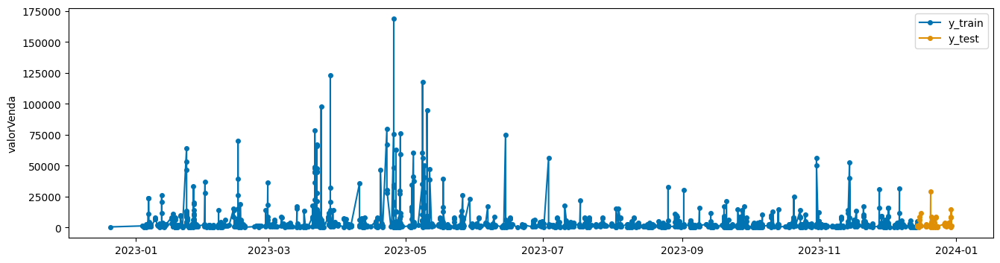

<Figure size 1200x600 with 0 Axes>

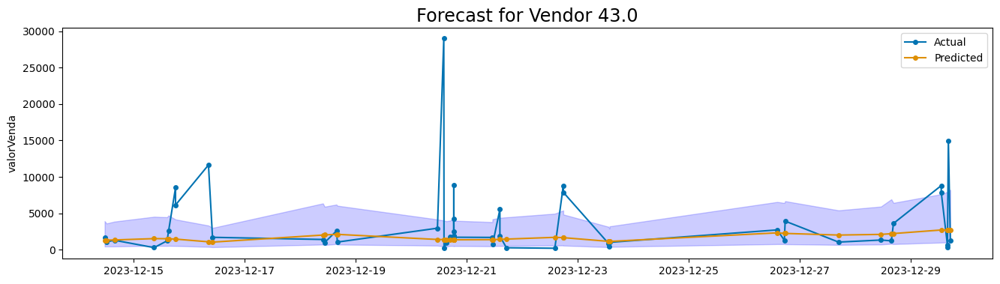

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/dvofuhm1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/00zbok2g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4834', 'data', 'file=/tmp/tmpky2udtu8/dvofuhm1.json', 'init=/tmp/tmpky2udtu8/00zbok2g.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modell2b6hwsy/prophet_model-20250408002619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: Yes
Drift Score: 0.2518840432167053
P-Value: 0.0415104404091835


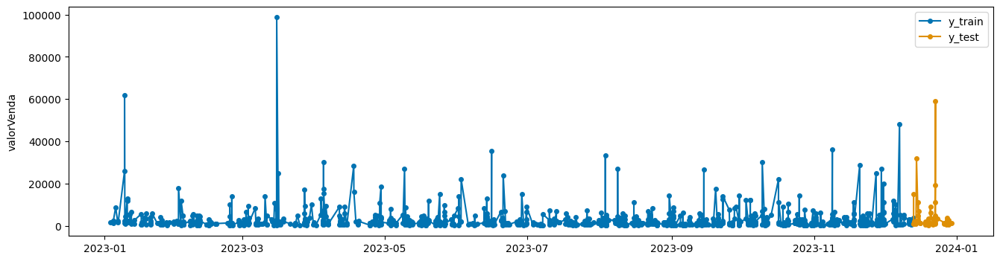

<Figure size 1200x600 with 0 Axes>

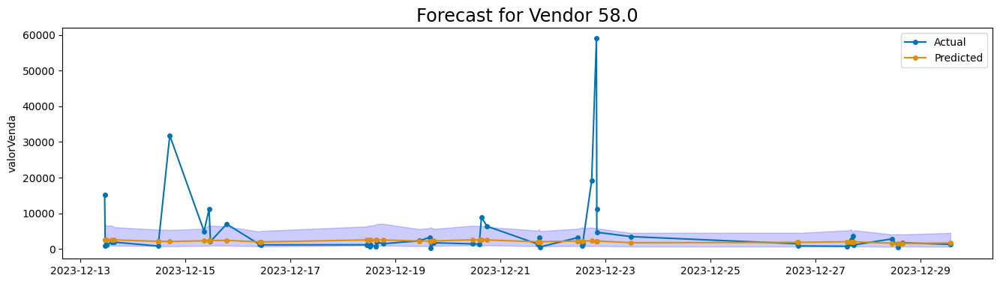

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/x_mxkkyx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/msurz9uw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87193', 'data', 'file=/tmp/tmpky2udtu8/x_mxkkyx.json', 'init=/tmp/tmpky2udtu8/msurz9uw.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelkov20e7y/prophet_model-20250408002620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.1894736886024475
P-Value: 0.25313010811805725


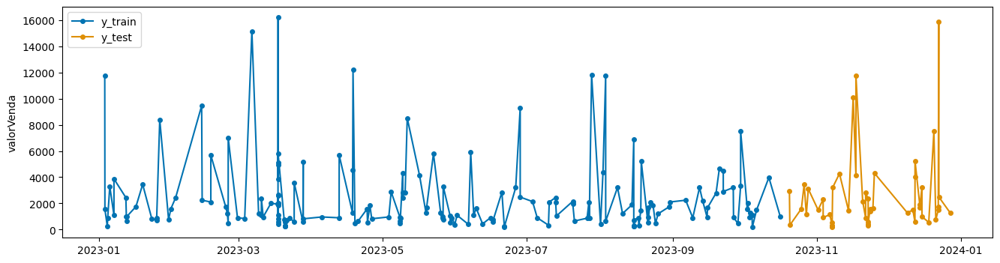

<Figure size 1200x600 with 0 Axes>

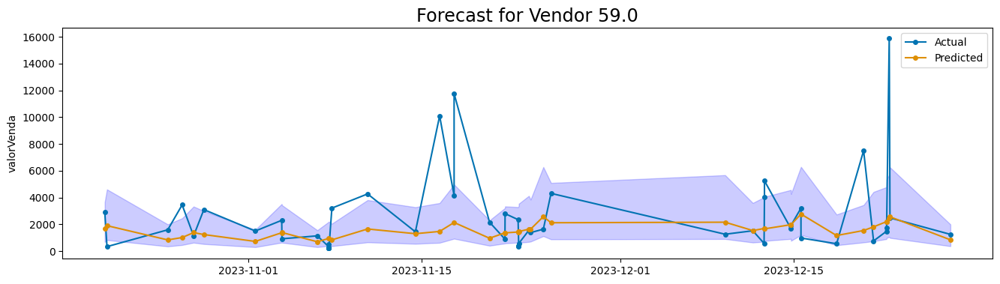

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/bs8rscj2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/wexhyz0c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64585', 'data', 'file=/tmp/tmpky2udtu8/bs8rscj2.json', 'init=/tmp/tmpky2udtu8/wexhyz0c.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelvfzaze4p/prophet_model-20250408002621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: Yes
Drift Score: 0.27344632148742676
P-Value: 0.020858900621533394


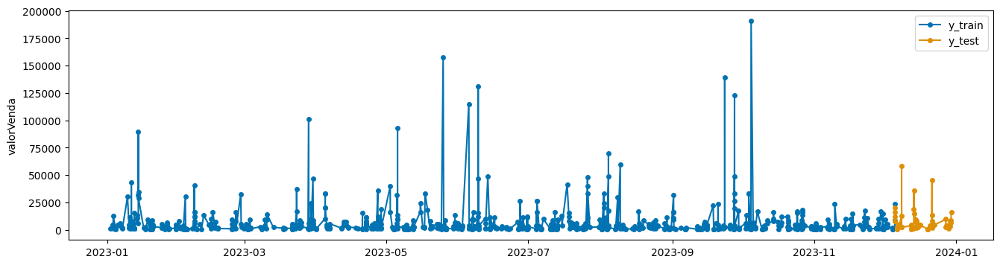

<Figure size 1200x600 with 0 Axes>

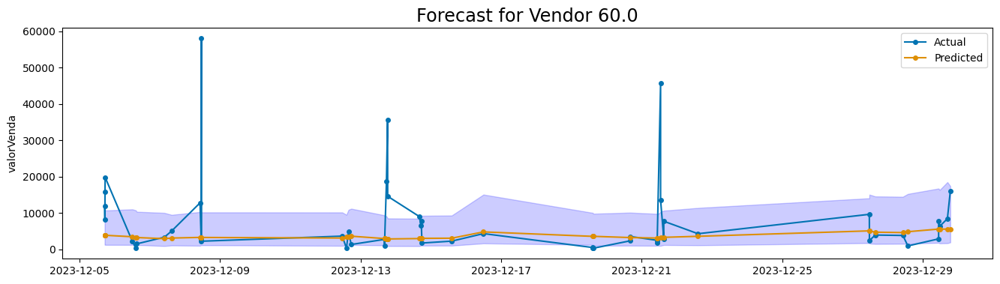

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/49cgfbl3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/whubww84.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7298', 'data', 'file=/tmp/tmpky2udtu8/49cgfbl3.json', 'init=/tmp/tmpky2udtu8/whubww84.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model_pp401nt/prophet_model-20250408002622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.10833333432674408
P-Value: 0.8495498895645142


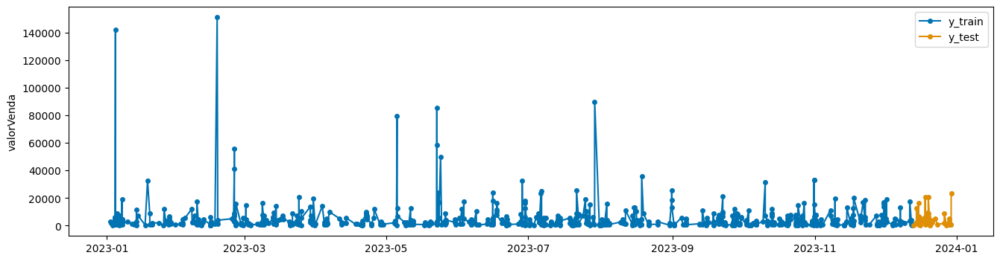

<Figure size 1200x600 with 0 Axes>

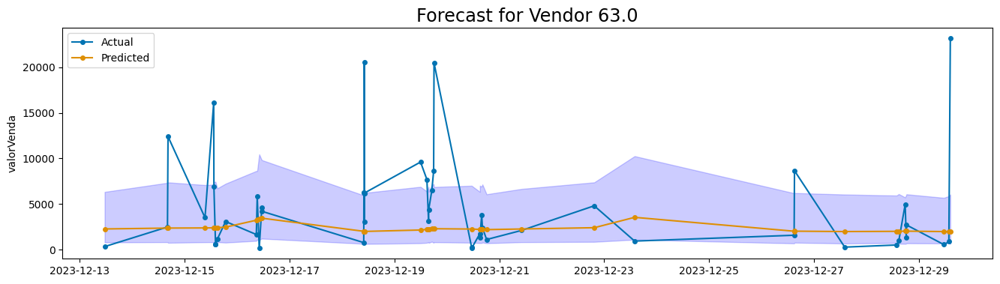

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/s51xw332.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/inqaka0i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96535', 'data', 'file=/tmp/tmpky2udtu8/s51xw332.json', 'init=/tmp/tmpky2udtu8/inqaka0i.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelwcvss4lw/prophet_model-20250408002623.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.13957218825817108
P-Value: 0.5976295471191406


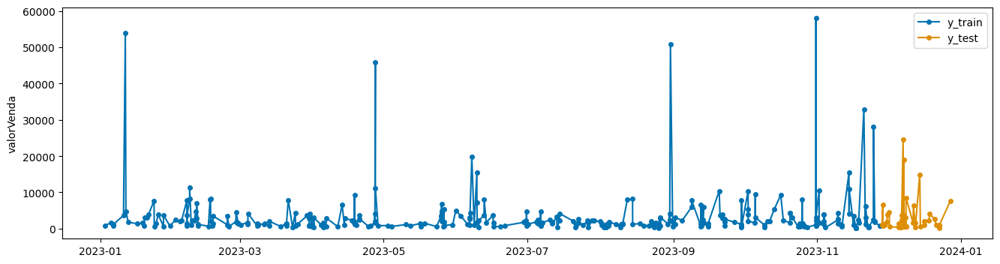

<Figure size 1200x600 with 0 Axes>

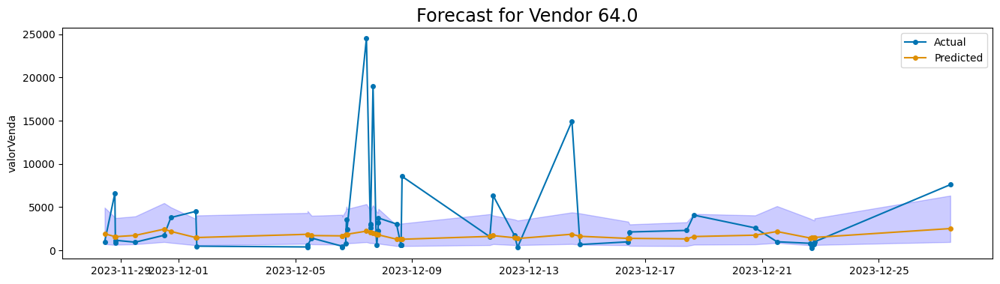

Número de pontos muito baixo
Drift: No
Drift Score: 0.13957218825817108
P-Value: 0.5976295471191406


<Figure size 1200x600 with 0 Axes>

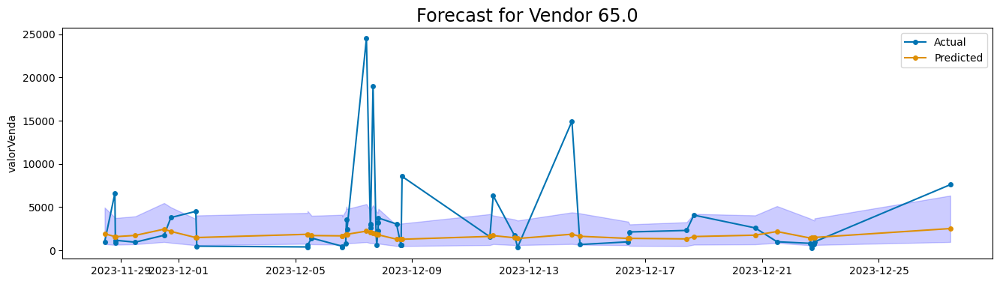

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/f41acdlz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/p18tun4g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86855', 'data', 'file=/tmp/tmpky2udtu8/f41acdlz.json', 'init=/tmp/tmpky2udtu8/p18tun4g.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model74a9_ld1/prophet_model-20250408002625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.17554239928722382
P-Value: 0.3797650933265686


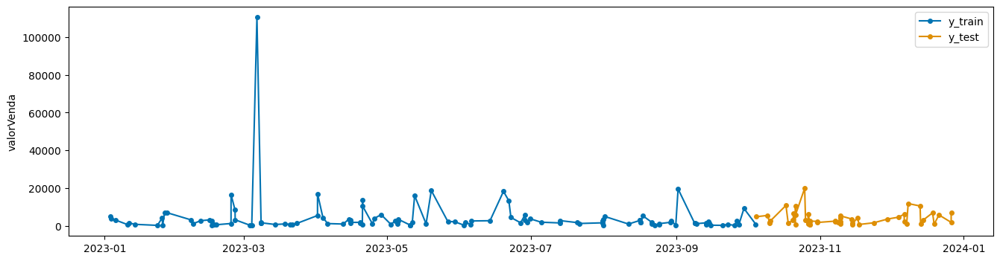

<Figure size 1200x600 with 0 Axes>

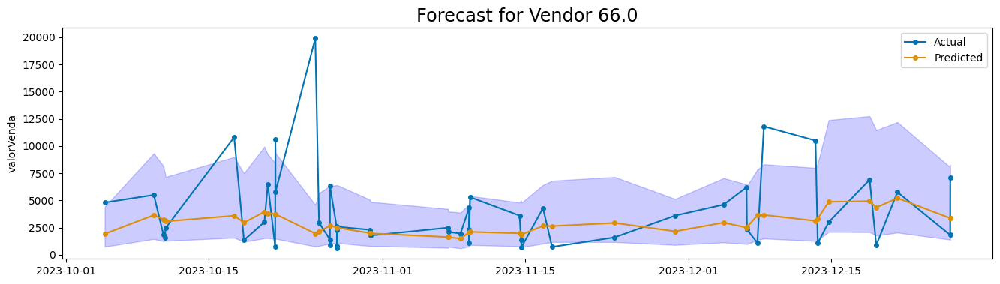

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/t_u8qm0b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/87zqt1fu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41582', 'data', 'file=/tmp/tmpky2udtu8/t_u8qm0b.json', 'init=/tmp/tmpky2udtu8/87zqt1fu.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modeld9cnl8dm/prophet_model-20250408002625.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
00:26:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.10350877046585083
P-Value: 0.967721700668335


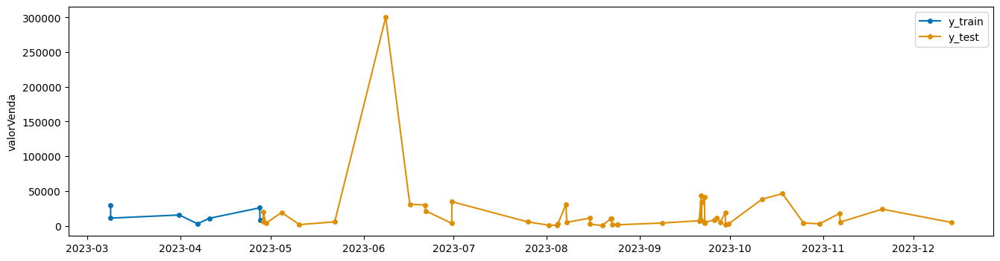

<Figure size 1200x600 with 0 Axes>

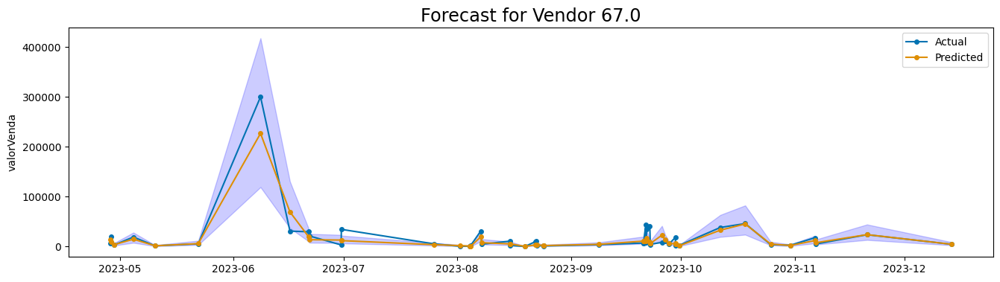

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/rxiso116.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/bpp550ia.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57509', 'data', 'file=/tmp/tmpky2udtu8/rxiso116.json', 'init=/tmp/tmpky2udtu8/bpp550ia.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modeltb0nob7t/prophet_model-20250408002626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.11661601066589355
P-Value: 0.782926082611084


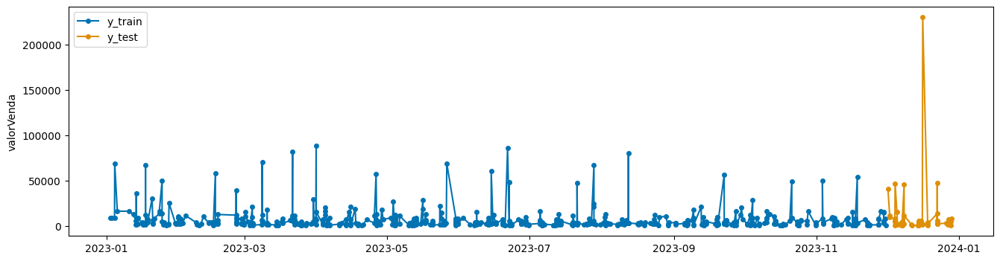

<Figure size 1200x600 with 0 Axes>

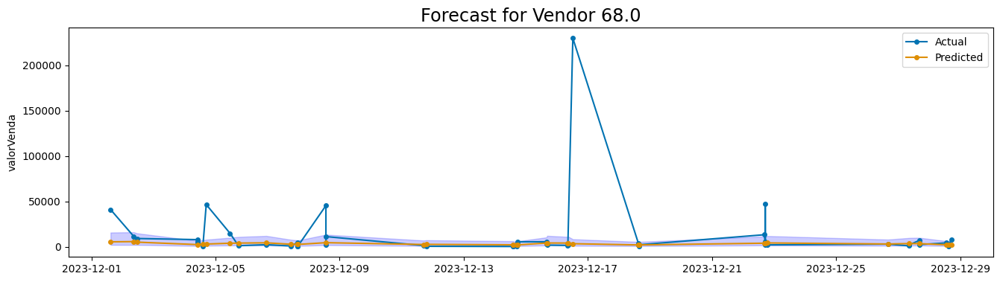

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/nig63uez.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/1ypcpc49.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61810', 'data', 'file=/tmp/tmpky2udtu8/nig63uez.json', 'init=/tmp/tmpky2udtu8/1ypcpc49.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model6h0w1eb3/prophet_model-20250408002627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.13737373054027557
P-Value: 0.6386282444000244


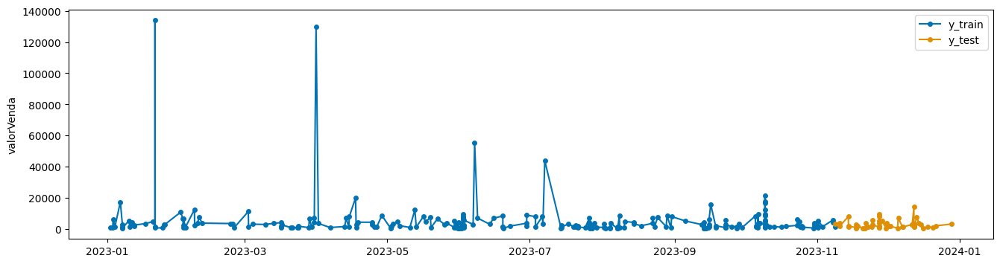

<Figure size 1200x600 with 0 Axes>

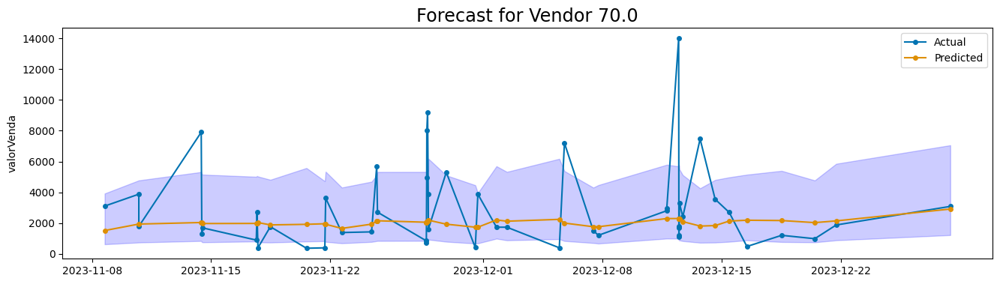

Número de pontos muito baixo
Drift: No
Drift Score: 0.13737373054027557
P-Value: 0.6386282444000244


<Figure size 1200x600 with 0 Axes>

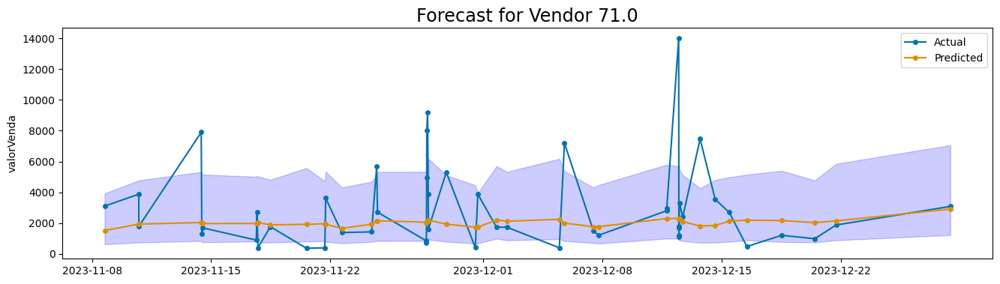

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/fw9c9zai.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/4bkb8gw5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82126', 'data', 'file=/tmp/tmpky2udtu8/fw9c9zai.json', 'init=/tmp/tmpky2udtu8/4bkb8gw5.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelqw5kxr_8/prophet_model-20250408002628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.13879552483558655
P-Value: 0.6045510768890381


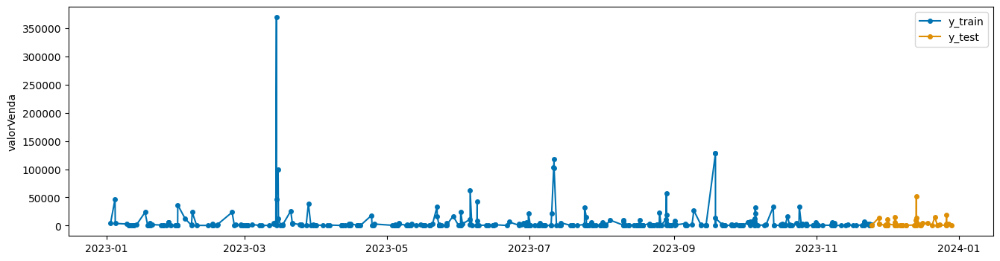

<Figure size 1200x600 with 0 Axes>

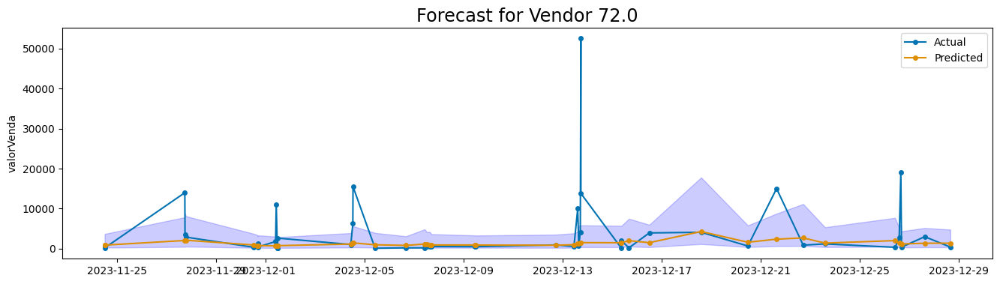

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/qwi0cde6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/_xzye8w8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67270', 'data', 'file=/tmp/tmpky2udtu8/qwi0cde6.json', 'init=/tmp/tmpky2udtu8/_xzye8w8.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model9v1jx6et/prophet_model-20250408002629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.17005649209022522
P-Value: 0.3732786178588867


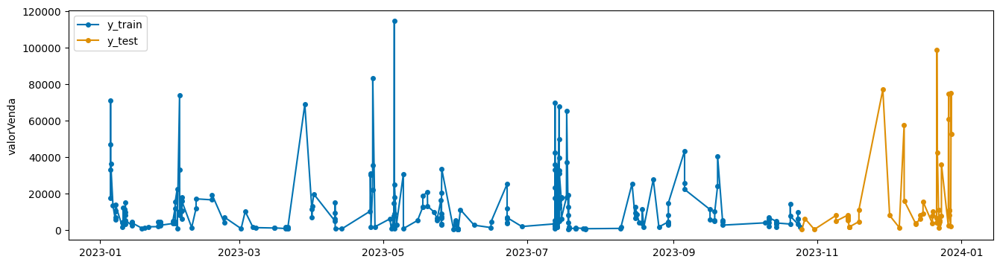

<Figure size 1200x600 with 0 Axes>

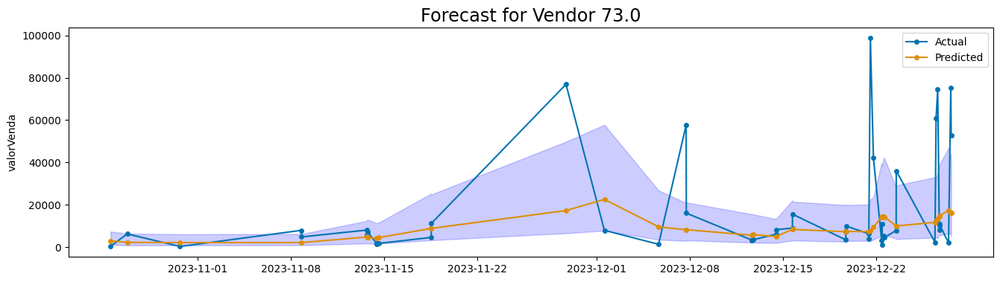

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/ohwalg_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/gclu4jem.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19147', 'data', 'file=/tmp/tmpky2udtu8/ohwalg_2.json', 'init=/tmp/tmpky2udtu8/gclu4jem.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelip283b9x/prophet_model-20250408002630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.12329472601413727
P-Value: 0.7612430453300476


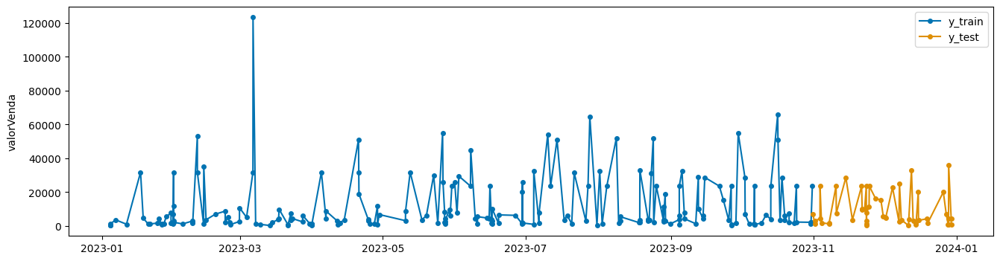

<Figure size 1200x600 with 0 Axes>

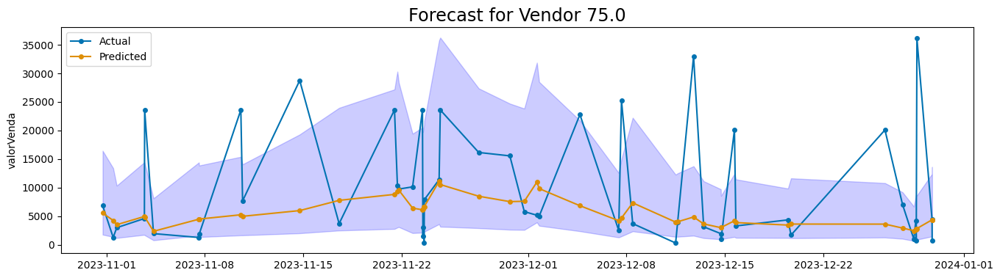

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/pht3gniz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/9kid5peo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57804', 'data', 'file=/tmp/tmpky2udtu8/pht3gniz.json', 'init=/tmp/tmpky2udtu8/9kid5peo.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modeli4kg7jp_/prophet_model-20250408002631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.18346883356571198
P-Value: 0.2506767511367798


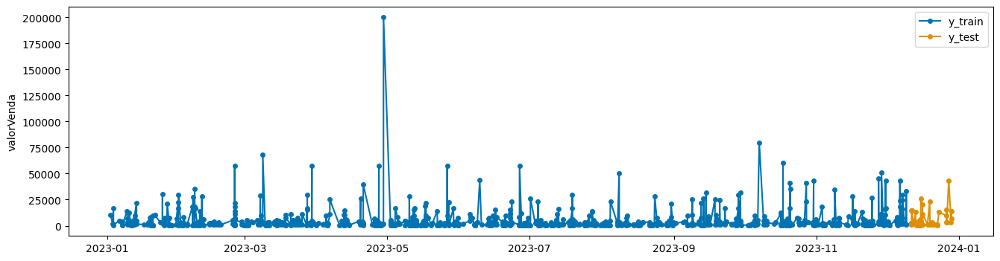

<Figure size 1200x600 with 0 Axes>

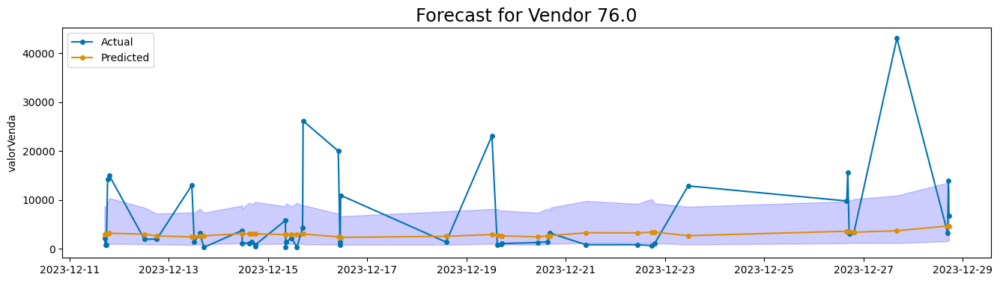

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/tiyun6f4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/otm00un6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94065', 'data', 'file=/tmp/tmpky2udtu8/tiyun6f4.json', 'init=/tmp/tmpky2udtu8/otm00un6.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelh0s0lkx7/prophet_model-20250408002632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.1305769979953766
P-Value: 0.6582972407341003


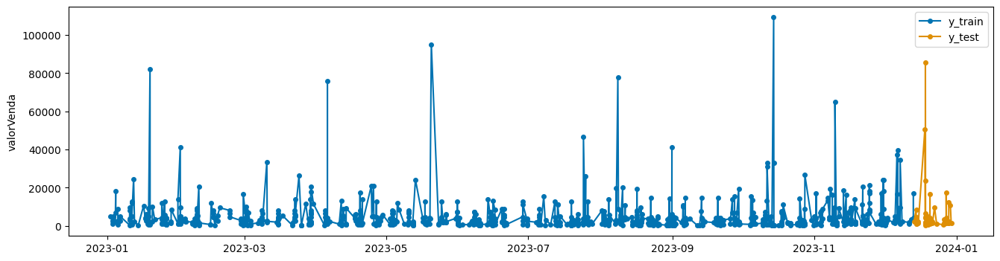

<Figure size 1200x600 with 0 Axes>

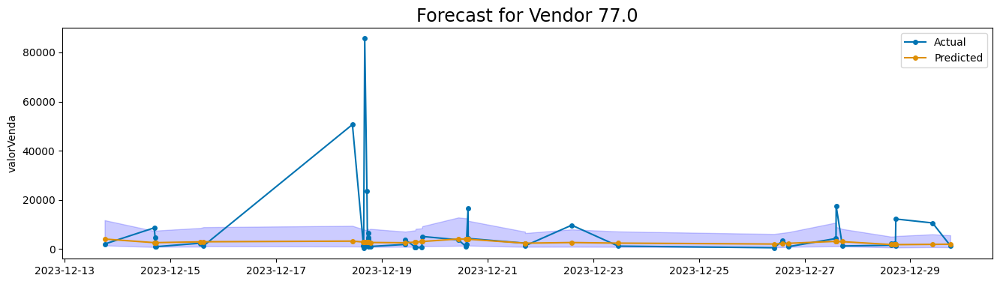

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/ba1qeo45.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/ze9war73.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44032', 'data', 'file=/tmp/tmpky2udtu8/ba1qeo45.json', 'init=/tmp/tmpky2udtu8/ze9war73.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelg7elj4aa/prophet_model-20250408002633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.1283687949180603
P-Value: 0.7177794575691223


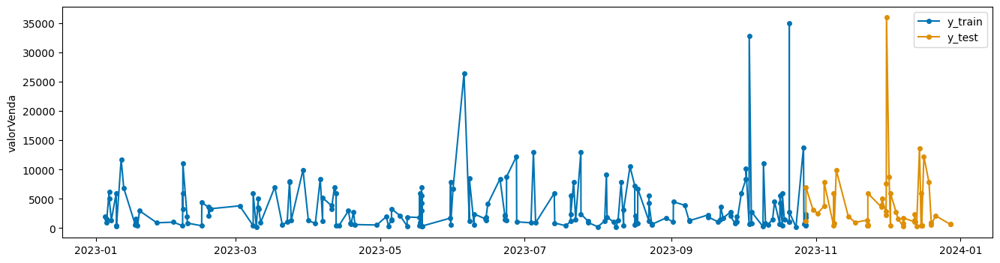

<Figure size 1200x600 with 0 Axes>

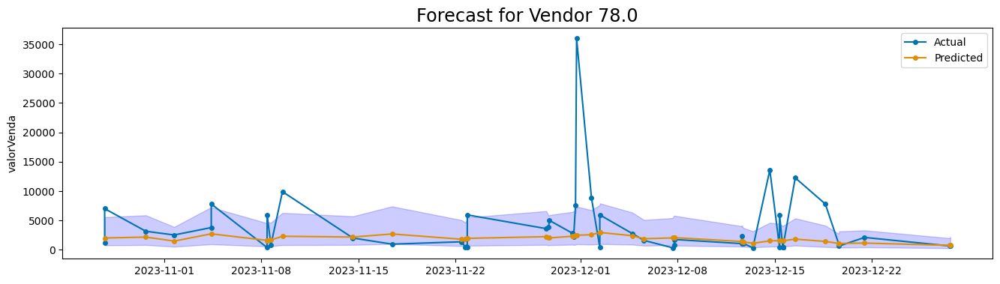

Número de pontos muito baixo
Drift: No
Drift Score: 0.1283687949180603
P-Value: 0.7177794575691223


<Figure size 1200x600 with 0 Axes>

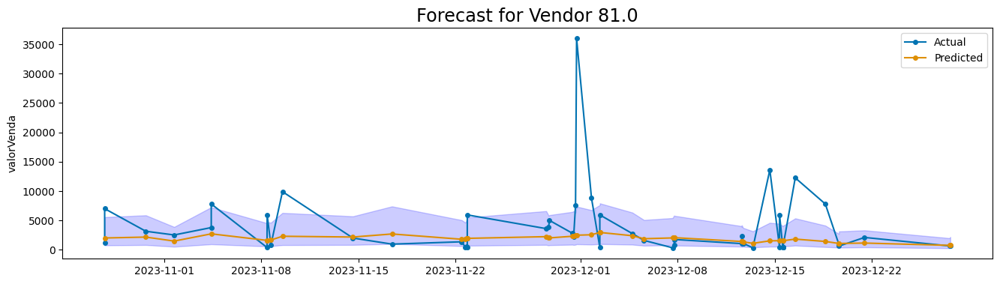

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/97n1iz4j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/a7g9swic.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75864', 'data', 'file=/tmp/tmpky2udtu8/97n1iz4j.json', 'init=/tmp/tmpky2udtu8/a7g9swic.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modeliuqm30v0/prophet_model-20250408002634.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.13577236235141754
P-Value: 0.6742997765541077


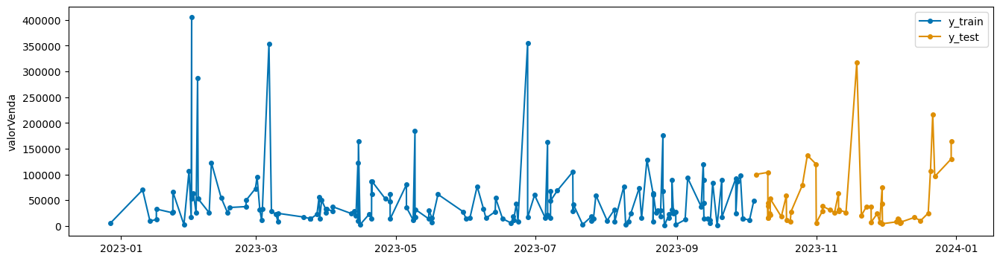

<Figure size 1200x600 with 0 Axes>

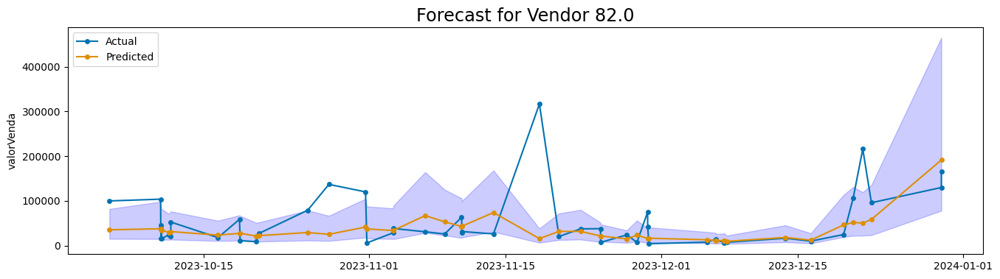

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/zqw49wvk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/kp1k6mpm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64819', 'data', 'file=/tmp/tmpky2udtu8/zqw49wvk.json', 'init=/tmp/tmpky2udtu8/kp1k6mpm.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelqknqqhzb/prophet_model-20250408002635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.15891341865062714
P-Value: 0.41349032521247864


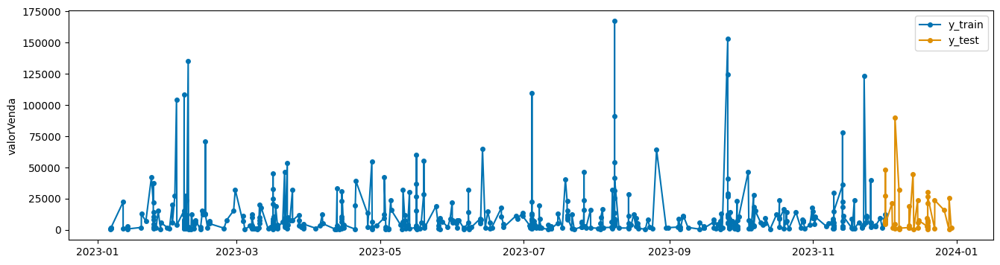

<Figure size 1200x600 with 0 Axes>

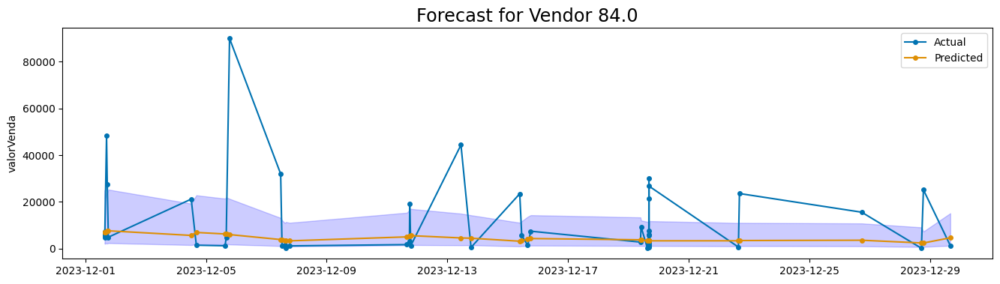

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/ef6r9uap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/hlo362d7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47740', 'data', 'file=/tmp/tmpky2udtu8/ef6r9uap.json', 'init=/tmp/tmpky2udtu8/hlo362d7.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelkz2hwvnd/prophet_model-20250408002637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.16744185984134674
P-Value: 0.3707890510559082


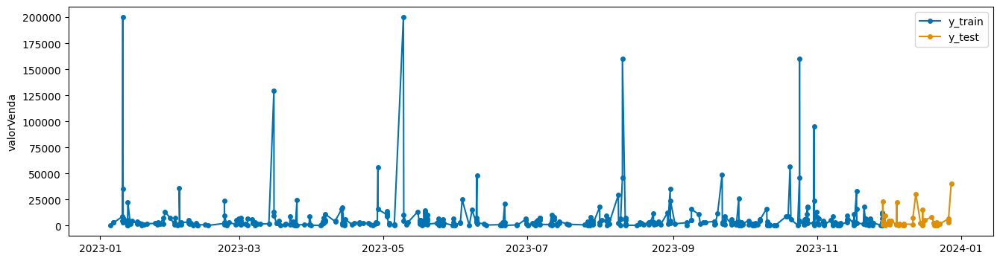

<Figure size 1200x600 with 0 Axes>

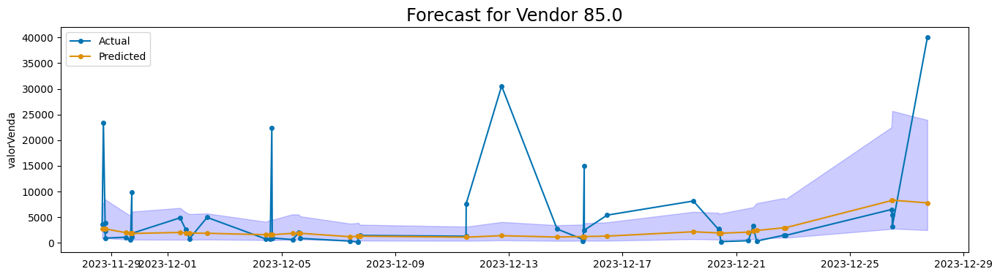

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/rg1iskmx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/zn_kl6qb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30098', 'data', 'file=/tmp/tmpky2udtu8/rg1iskmx.json', 'init=/tmp/tmpky2udtu8/zn_kl6qb.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modela5b8mhss/prophet_model-20250408002638.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.12983424961566925
P-Value: 0.6849168539047241


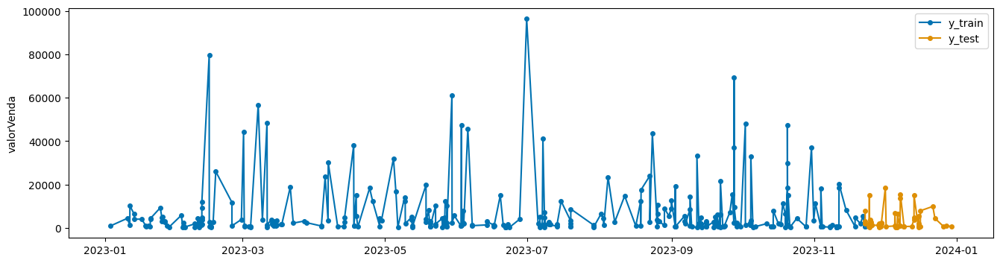

<Figure size 1200x600 with 0 Axes>

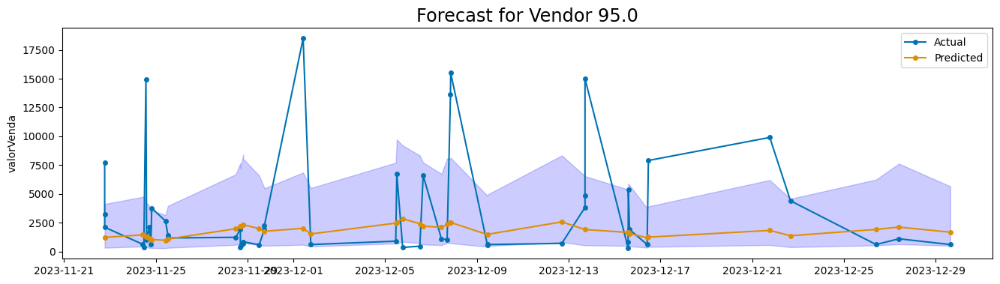

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/2y59c_73.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/t6la8u9q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67793', 'data', 'file=/tmp/tmpky2udtu8/2y59c_73.json', 'init=/tmp/tmpky2udtu8/t6la8u9q.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelns00pn2t/prophet_model-20250408002639.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
00:26:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.08556701242923737
P-Value: 0.990513265132904


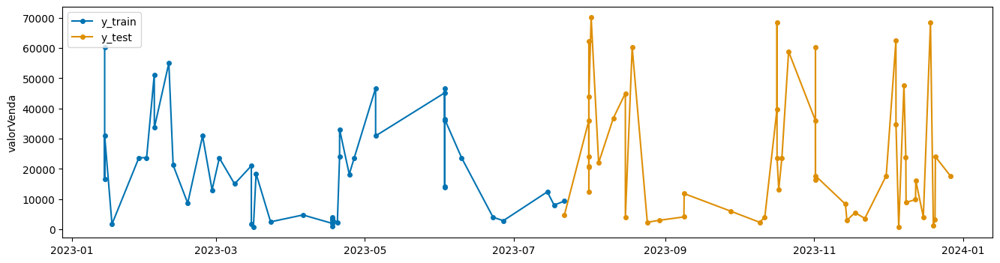

<Figure size 1200x600 with 0 Axes>

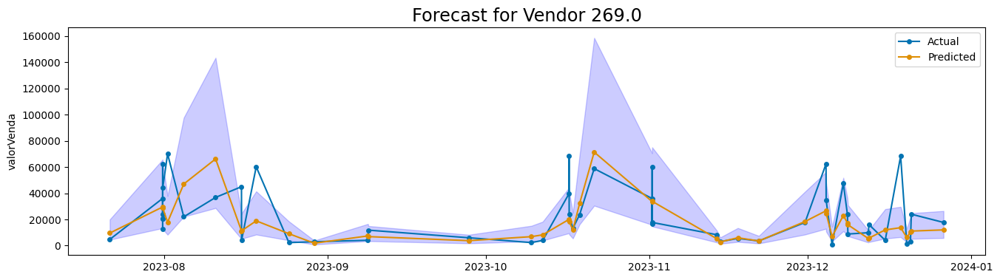

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/jxew_try.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/2sgs7366.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87805', 'data', 'file=/tmp/tmpky2udtu8/jxew_try.json', 'init=/tmp/tmpky2udtu8/2sgs7366.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelb1uqjscc/prophet_model-20250408002640.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.24477747082710266
P-Value: 0.05805386230349541


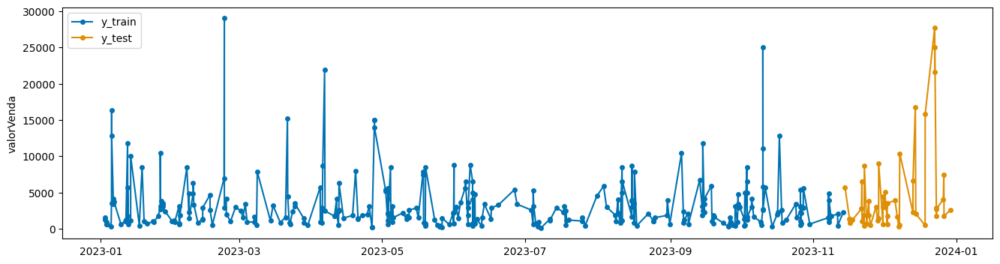

<Figure size 1200x600 with 0 Axes>

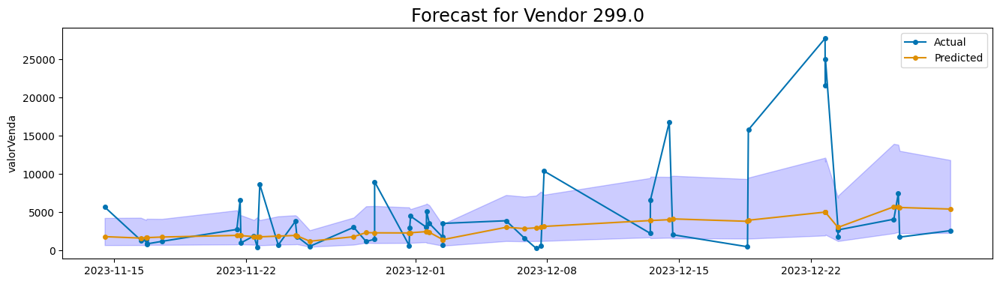

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/2sd8wibu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/c4corunl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82528', 'data', 'file=/tmp/tmpky2udtu8/2sd8wibu.json', 'init=/tmp/tmpky2udtu8/c4corunl.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelc_gctazs/prophet_model-20250408002641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: Yes
Drift Score: 0.32121211290359497
P-Value: 0.00453157490119338


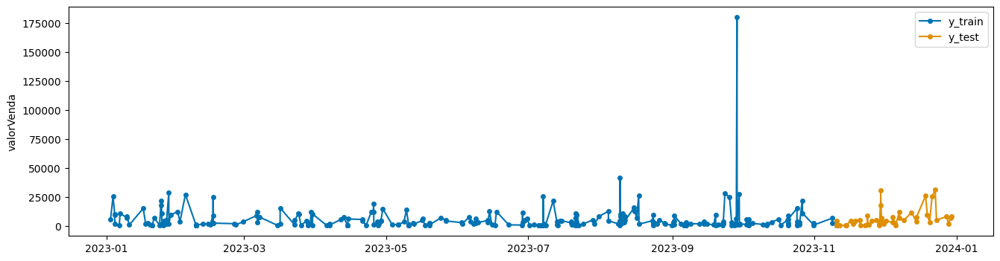

<Figure size 1200x600 with 0 Axes>

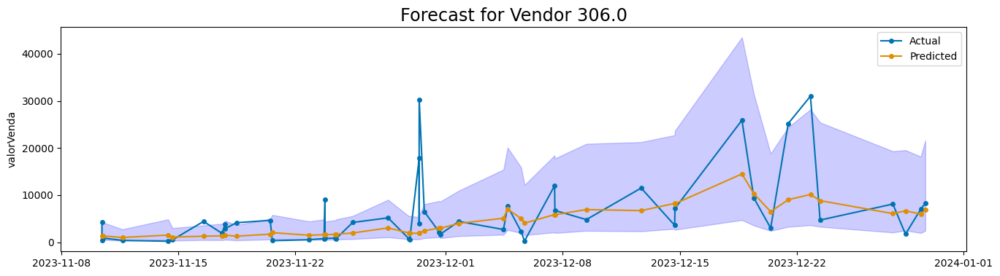

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/fhjz5yoi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/s880qw2m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89994', 'data', 'file=/tmp/tmpky2udtu8/fhjz5yoi.json', 'init=/tmp/tmpky2udtu8/s880qw2m.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelqja_g2qs/prophet_model-20250408002642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.1406504064798355
P-Value: 0.5668425559997559


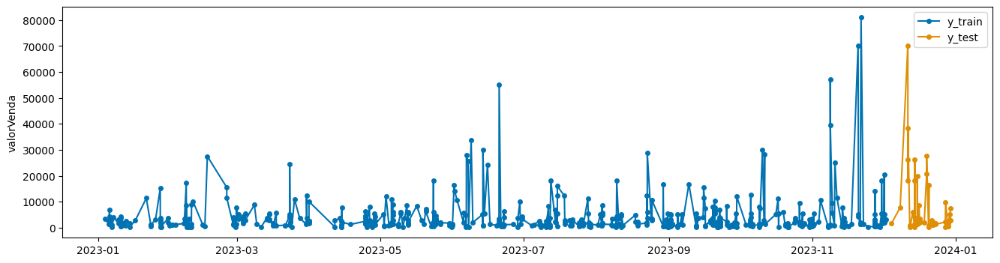

<Figure size 1200x600 with 0 Axes>

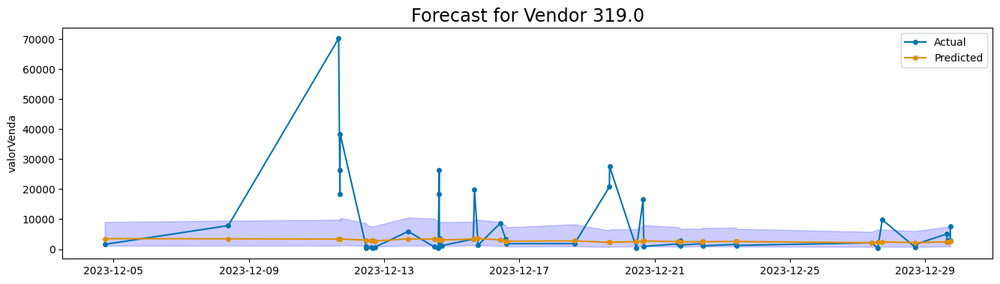

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/fbe0rupz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/wcbyptqq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23814', 'data', 'file=/tmp/tmpky2udtu8/fbe0rupz.json', 'init=/tmp/tmpky2udtu8/wcbyptqq.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model_sgi1b17/prophet_model-20250408002643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: Yes
Drift Score: 0.30398011207580566
P-Value: 0.015127236023545265


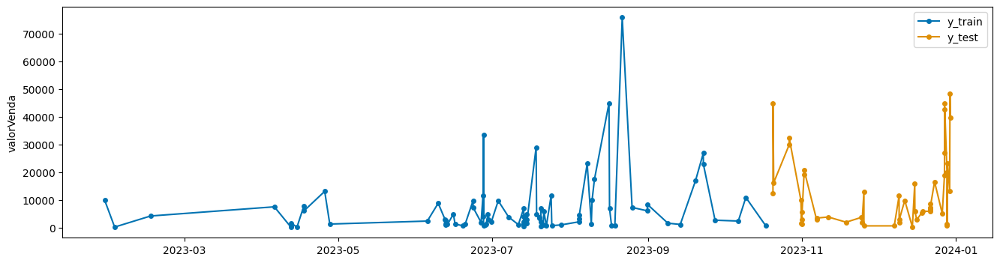

<Figure size 1200x600 with 0 Axes>

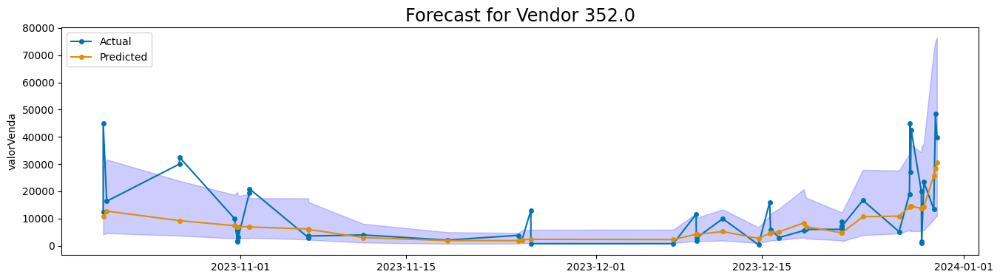

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/2k1eun3_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/8yhw1jsp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64192', 'data', 'file=/tmp/tmpky2udtu8/2k1eun3_.json', 'init=/tmp/tmpky2udtu8/8yhw1jsp.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model02lcimmc/prophet_model-20250408002643.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
00:26:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.12395833432674408
P-Value: 0.8818070888519287


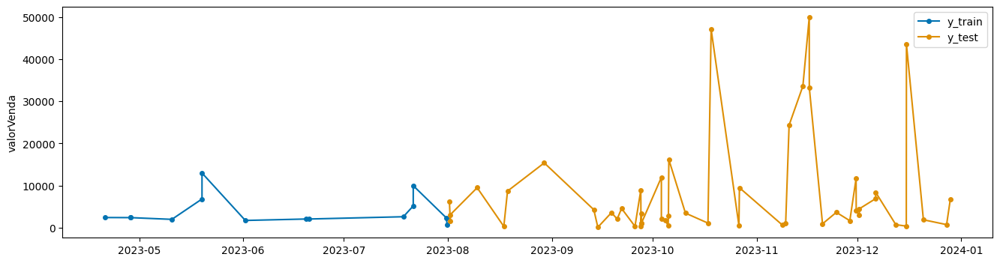

<Figure size 1200x600 with 0 Axes>

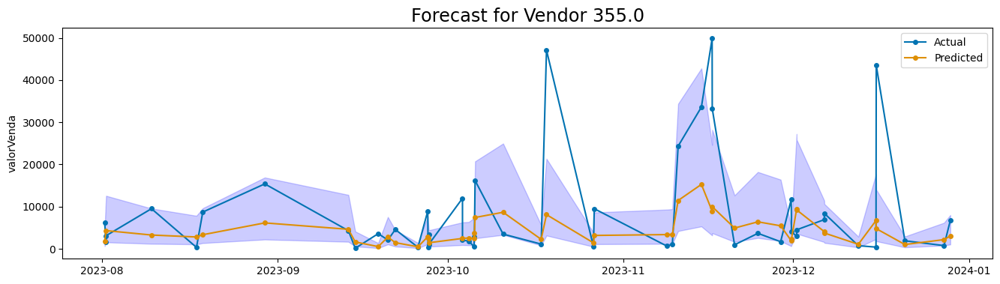

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/610rtbz3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/gfz42083.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28353', 'data', 'file=/tmp/tmpky2udtu8/610rtbz3.json', 'init=/tmp/tmpky2udtu8/gfz42083.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_model__sxsdbl/prophet_model-20250408002645.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
00:26:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.10303030163049698
P-Value: 0.9749513268470764


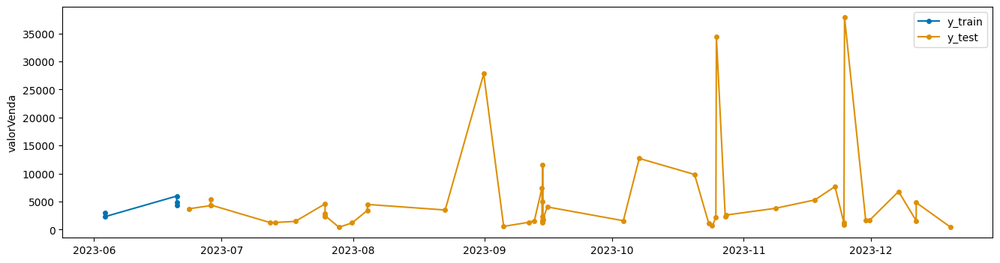

<Figure size 1200x600 with 0 Axes>

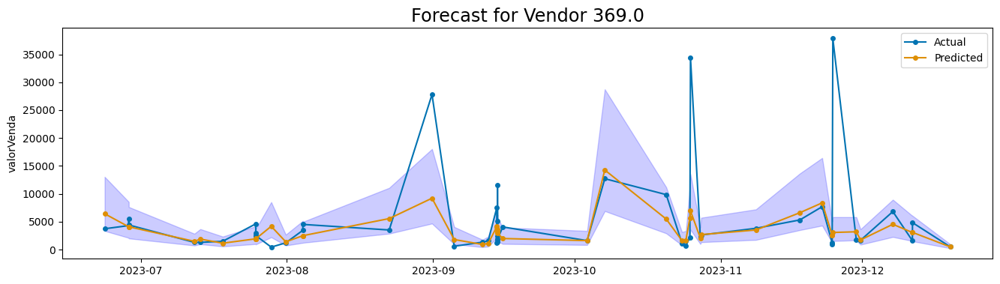

Número de pontos muito baixo
Drift: No
Drift Score: 0.10303030163049698
P-Value: 0.9749513268470764


<Figure size 1200x600 with 0 Axes>

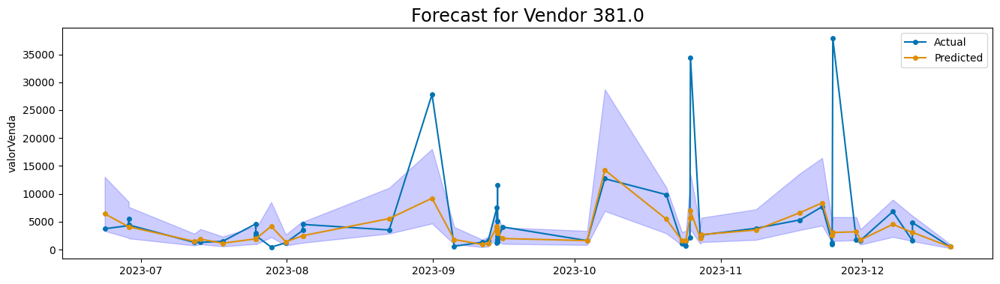

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/ldt6258c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/y9s1tkuk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4017', 'data', 'file=/tmp/tmpky2udtu8/ldt6258c.json', 'init=/tmp/tmpky2udtu8/y9s1tkuk.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelys9h912r/prophet_model-20250408002646.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
00:26:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.07999999821186066
P-Value: 0.9976333975791931


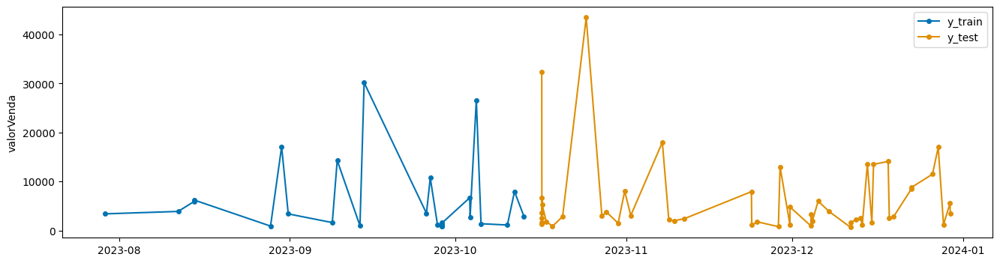

<Figure size 1200x600 with 0 Axes>

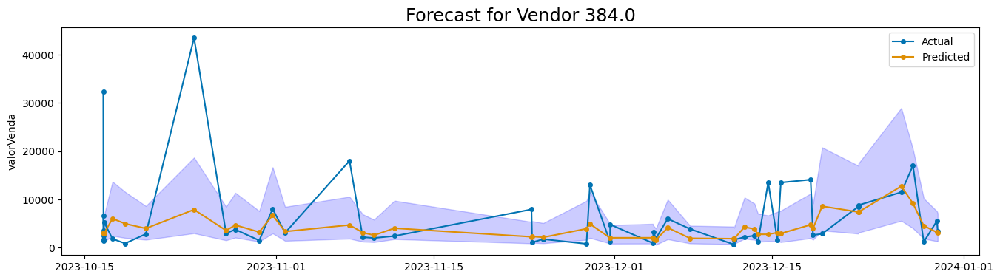

DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/d11fwk5h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpky2udtu8/6bm2pvoc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12911', 'data', 'file=/tmp/tmpky2udtu8/d11fwk5h.json', 'init=/tmp/tmpky2udtu8/6bm2pvoc.json', 'output', 'file=/tmp/tmpky2udtu8/prophet_modelayapyie4/prophet_model-20250408002647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:26:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:26:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Drift: No
Drift Score: 0.21568627655506134
P-Value: 0.2030637264251709


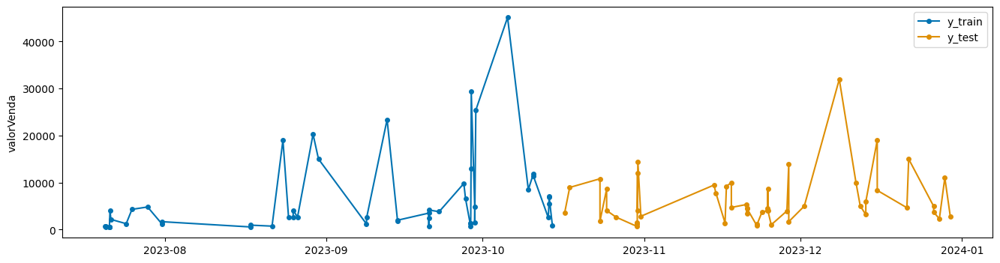

<Figure size 1200x600 with 0 Axes>

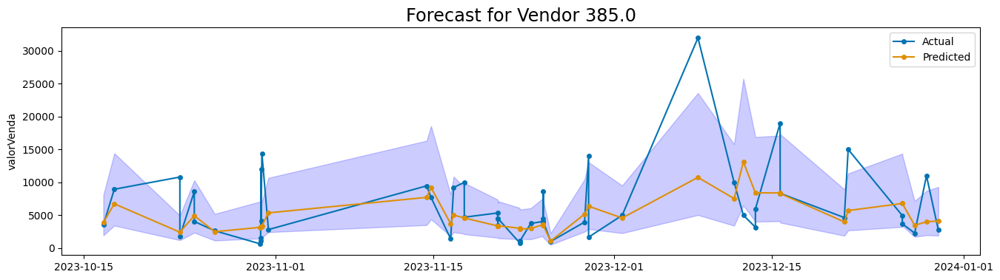

In [51]:
vendor_forecasts = {}
vendor_actuals = {}
forecasts = {}
vendor_codes = df.index.get_level_values(0).unique()

for vendor in vendor_codes:
    vendor_data = df.xs(vendor, level=0)
    y = vendor_data['valorVenda']
    try:
       forecast = train_test_forecast_vendor_sales(y, vendor)
    except:
      print('Número de pontos muito baixo')
      pass

    vendor_forecasts[vendor] = forecast['y_pred']
    vendor_actuals[vendor] = forecast['y_test']
    labels = ['No', 'Yes']
    print('Drift: {}'.format(labels[forecast['drift_detected']]))
    print('Drift Score: {}'.format(forecast['drift_score']))
    print('P-Value: {}'.format(forecast['p_value']))

    plot_actual_vs_predicted(forecast, forecast['y_test'], forecast['y_pred'], title=f"Forecast for Vendor {vendor}")

# Actual forecast

In [14]:
def forecast_vendor_sales(vendor_df, vendor_id, periods=365, coverage=0.65):
    """Forecast sales for a single vendor"""
    try:
        fh = ForecastingHorizon(pd.date_range(vendor_df.index[-1], periods=periods, freq='D')[1:], is_relative=False)

        forecaster = LogTransformer() * Prophet(
            seasonality_mode='additive',  # or 'multiplicative'
            weekly_seasonality=True,
            daily_seasonality=False  # daily data
        )

        forecaster.fit(vendor_df)

        y_pred = forecaster.predict(fh)
        pred_intervals = forecaster.predict_interval(fh, coverage=coverage)

        lower = pred_intervals.loc[:, (['valorVenda'], [coverage], ['lower'])]
        upper = pred_intervals.loc[:, (['valorVenda'], [coverage], ['upper'])]

        if isinstance(lower, pd.DataFrame):
            lower = lower.iloc[:, 0]
        if isinstance(upper, pd.DataFrame):
            upper = upper.iloc[:, 0]

        if not validate_forecast(y_pred, lower, upper, vendor_id):
            return None

        return {
            'vendor_id': vendor_id,
            'forecast': y_pred,
            'lower_ci': lower,
            'upper_ci': upper
        }

    except Exception as e:
        print(f"Error forecasting for vendor {vendor_id}: {e}")
        return None  # Indicate failure

13:30:38 - cmdstanpy - INFO - Chain [1] start processing
13:30:38 - cmdstanpy - INFO - Chain [1] done processing


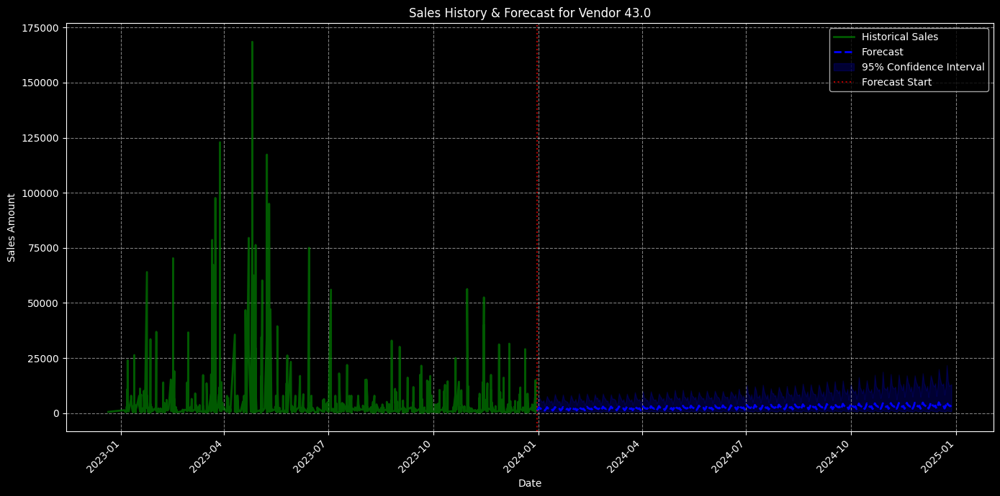

13:30:39 - cmdstanpy - INFO - Chain [1] start processing
13:30:39 - cmdstanpy - INFO - Chain [1] done processing


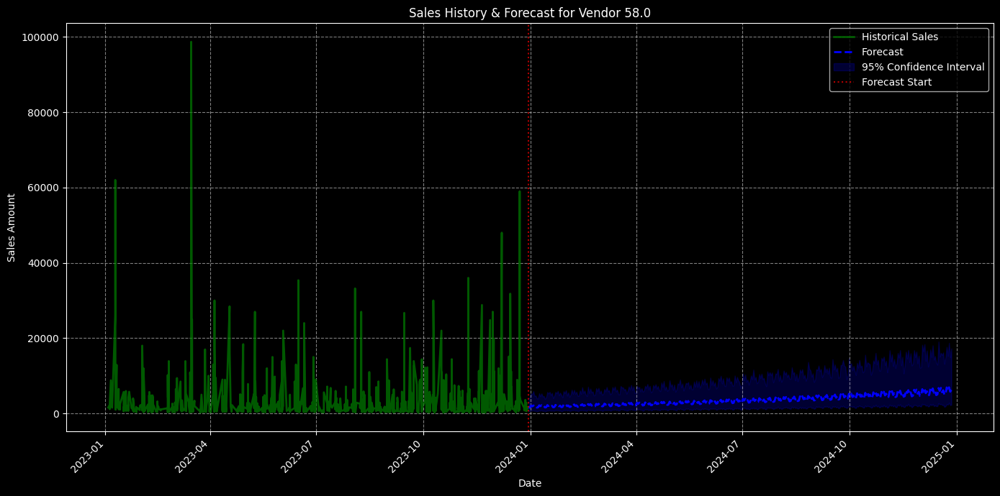

13:30:39 - cmdstanpy - INFO - Chain [1] start processing
13:30:39 - cmdstanpy - INFO - Chain [1] done processing


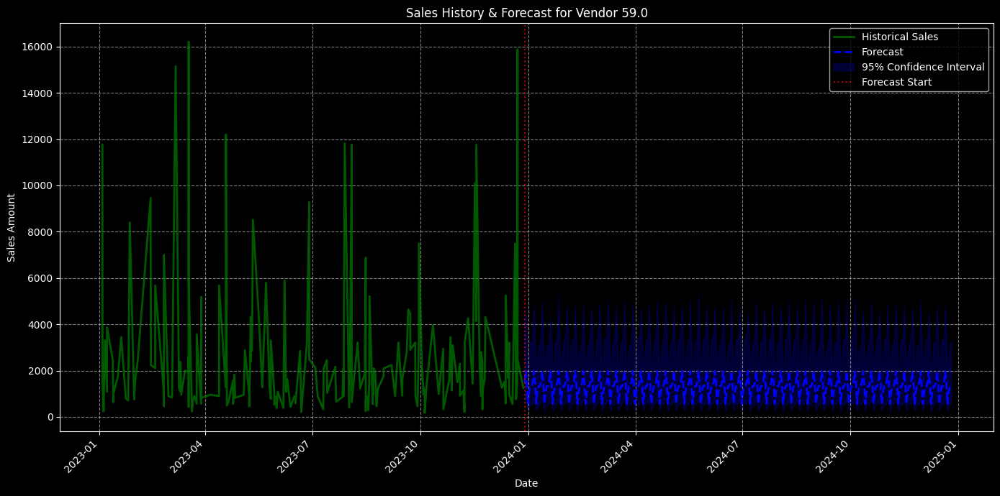

13:30:39 - cmdstanpy - INFO - Chain [1] start processing
13:30:39 - cmdstanpy - INFO - Chain [1] done processing


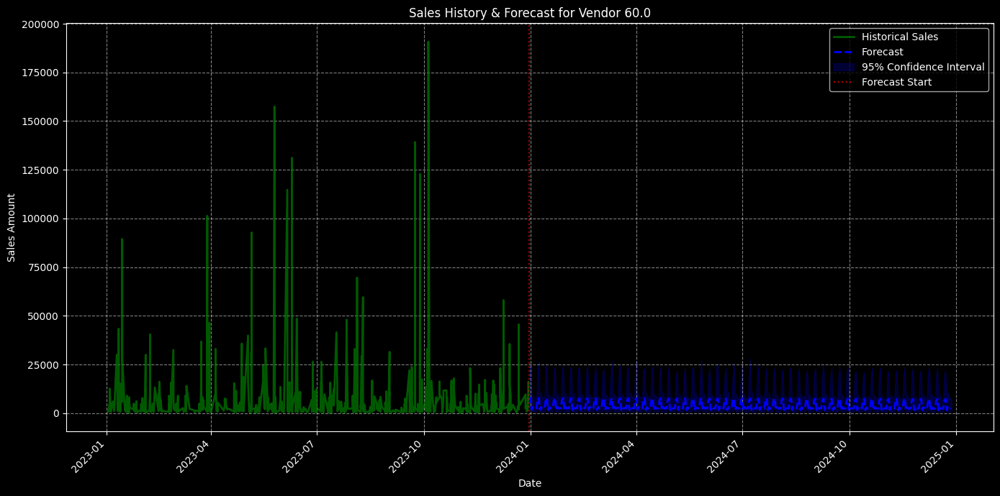

13:30:40 - cmdstanpy - INFO - Chain [1] start processing
13:30:40 - cmdstanpy - INFO - Chain [1] done processing


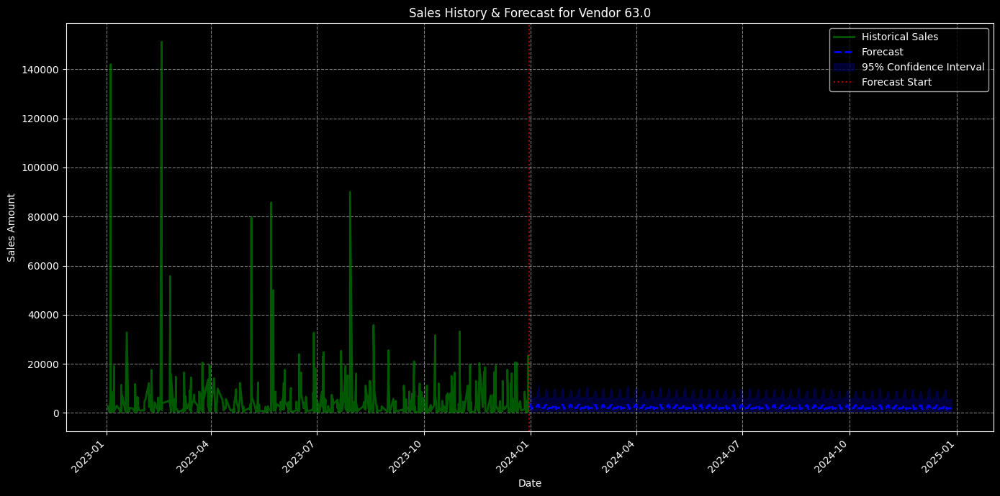

13:30:40 - cmdstanpy - INFO - Chain [1] start processing
13:30:40 - cmdstanpy - INFO - Chain [1] done processing


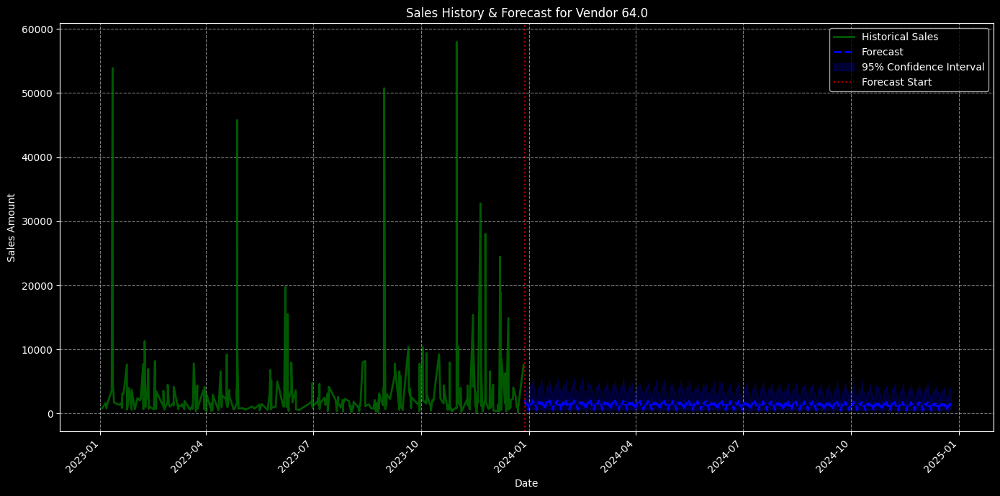

13:30:40 - cmdstanpy - INFO - Chain [1] start processing
13:30:40 - cmdstanpy - INFO - Chain [1] done processing


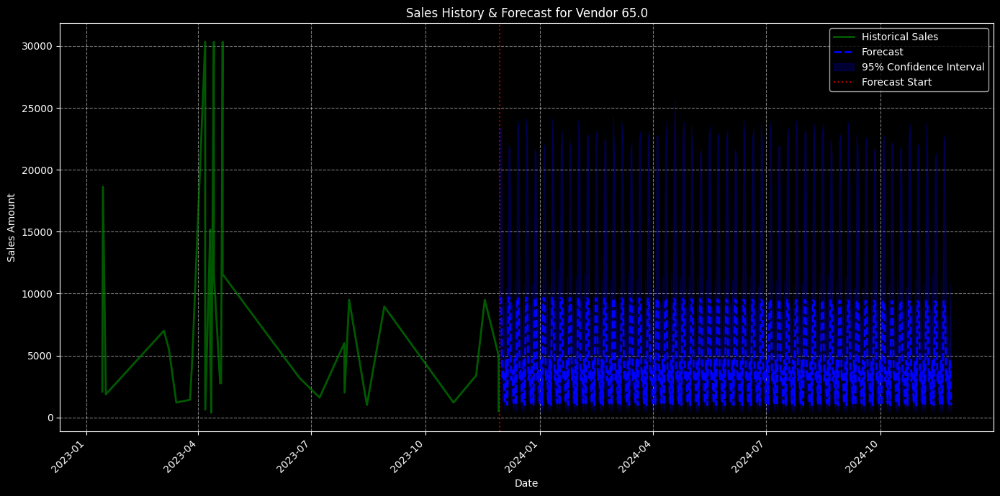

13:30:41 - cmdstanpy - INFO - Chain [1] start processing
13:30:41 - cmdstanpy - INFO - Chain [1] done processing


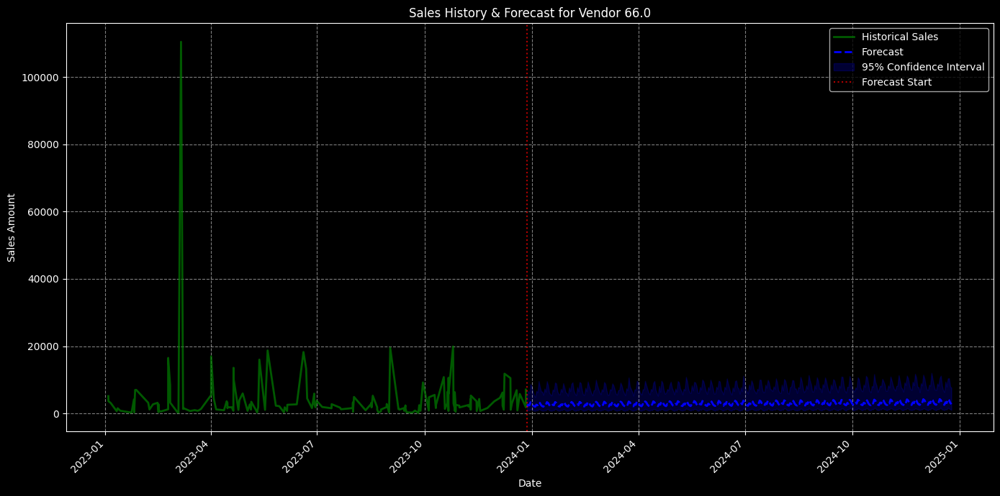

13:30:41 - cmdstanpy - INFO - Chain [1] start processing
13:30:41 - cmdstanpy - INFO - Chain [1] done processing


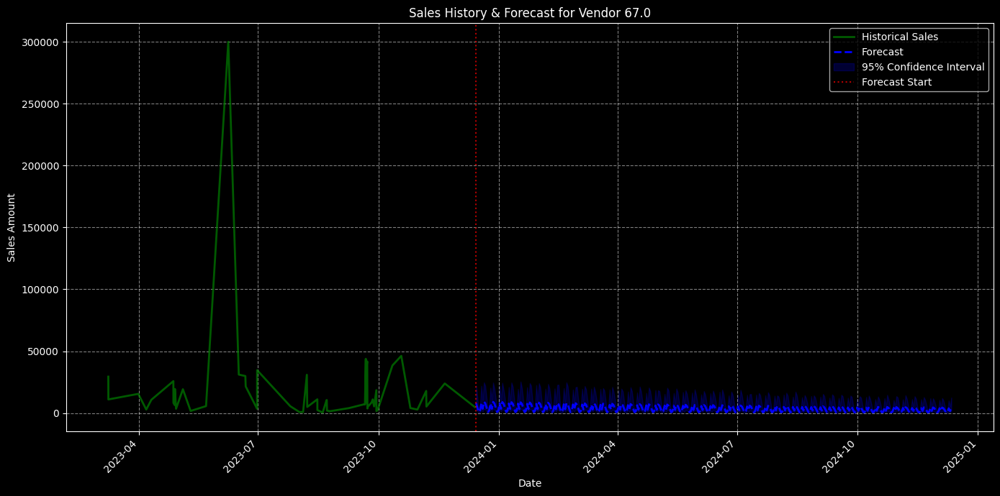

13:30:42 - cmdstanpy - INFO - Chain [1] start processing
13:30:42 - cmdstanpy - INFO - Chain [1] done processing


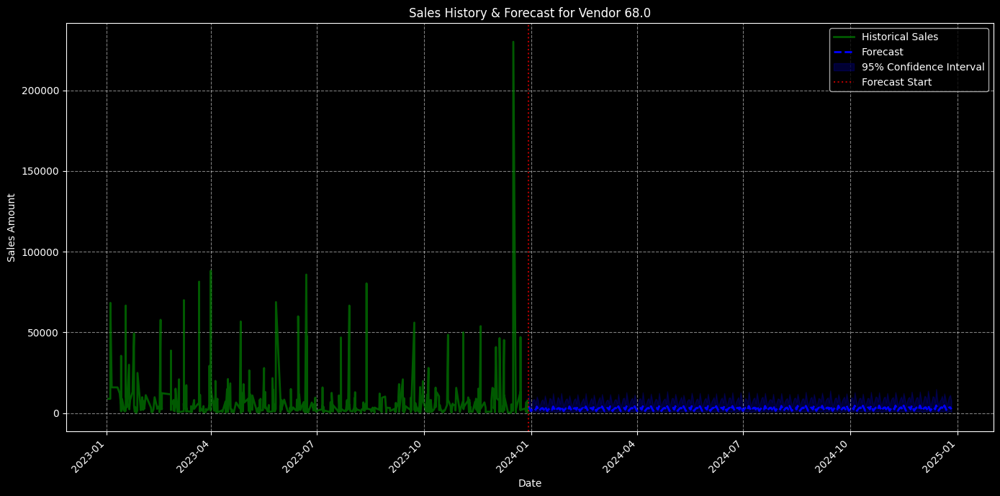

13:30:42 - cmdstanpy - INFO - Chain [1] start processing
13:30:42 - cmdstanpy - INFO - Chain [1] done processing


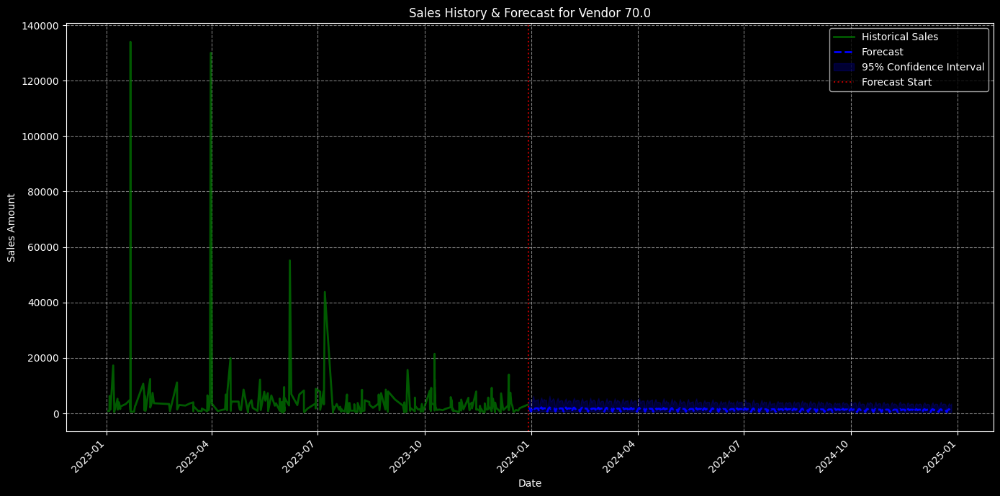

13:30:42 - cmdstanpy - INFO - Chain [1] start processing
13:30:42 - cmdstanpy - INFO - Chain [1] done processing


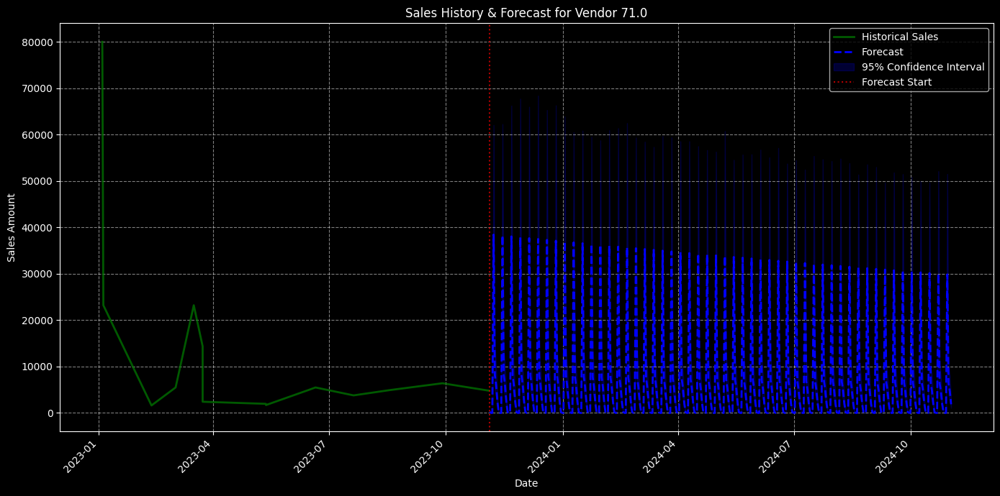

13:30:43 - cmdstanpy - INFO - Chain [1] start processing
13:30:43 - cmdstanpy - INFO - Chain [1] done processing


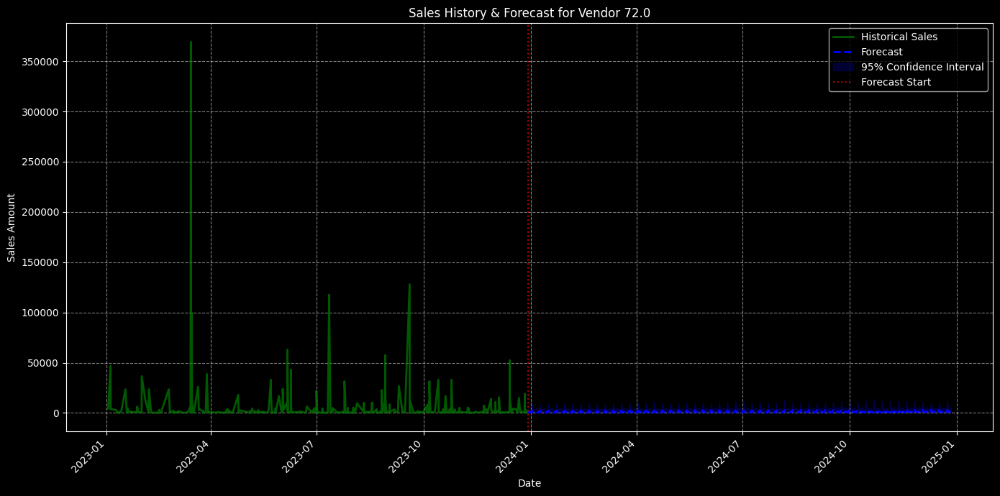

13:30:43 - cmdstanpy - INFO - Chain [1] start processing
13:30:43 - cmdstanpy - INFO - Chain [1] done processing


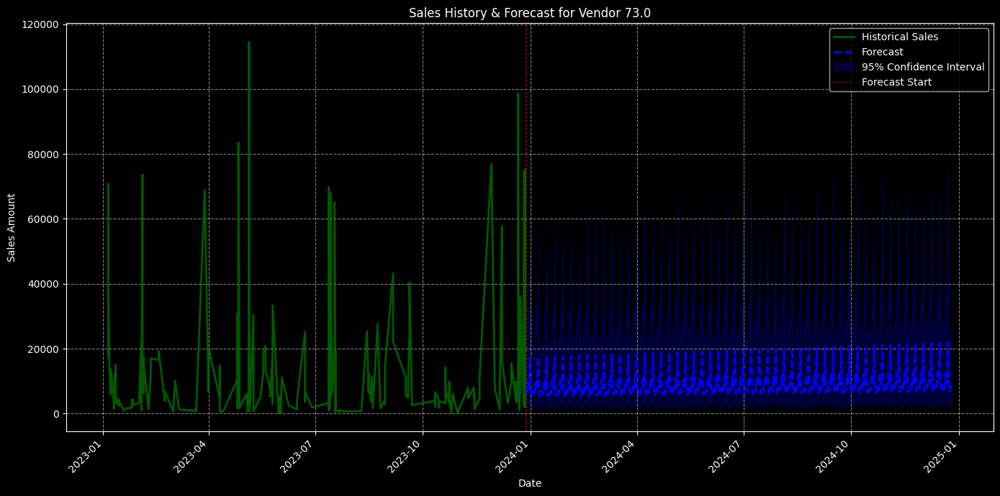

13:30:43 - cmdstanpy - INFO - Chain [1] start processing
13:30:43 - cmdstanpy - INFO - Chain [1] done processing


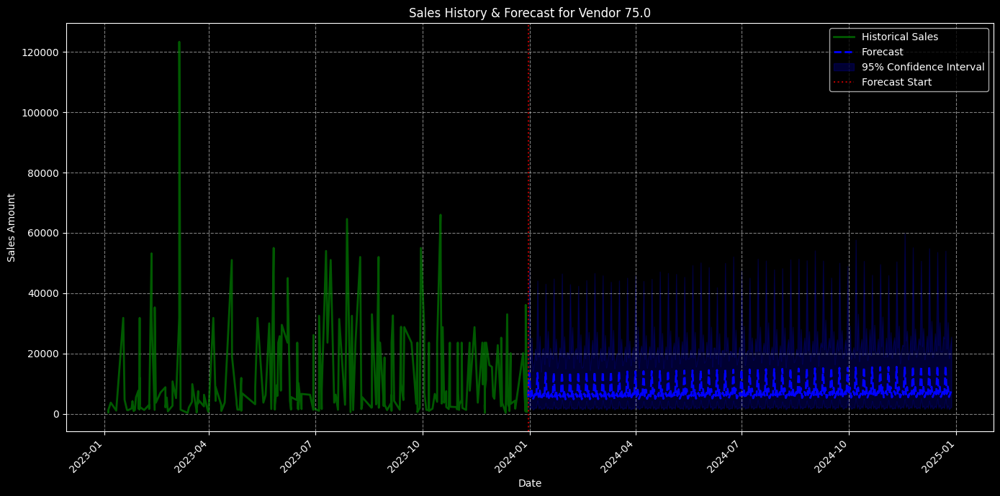

13:30:44 - cmdstanpy - INFO - Chain [1] start processing
13:30:44 - cmdstanpy - INFO - Chain [1] done processing


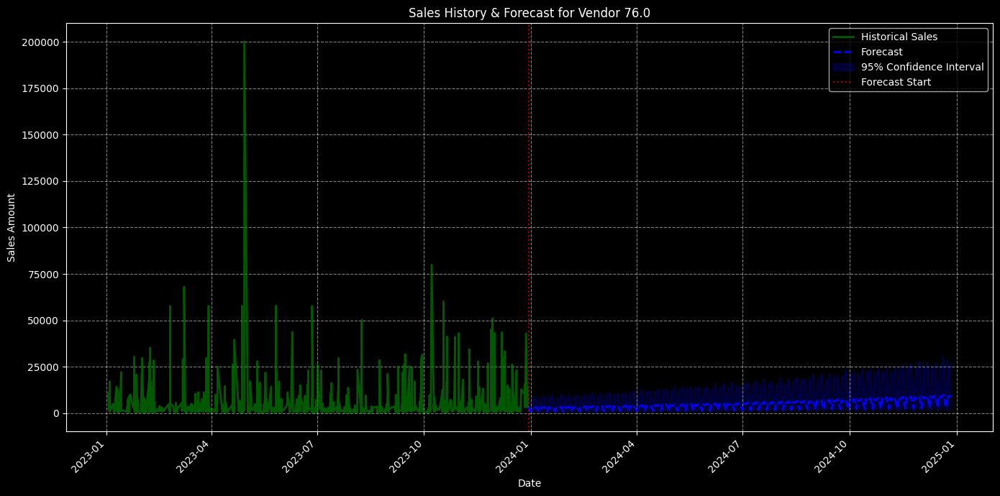

13:30:44 - cmdstanpy - INFO - Chain [1] start processing
13:30:44 - cmdstanpy - INFO - Chain [1] done processing


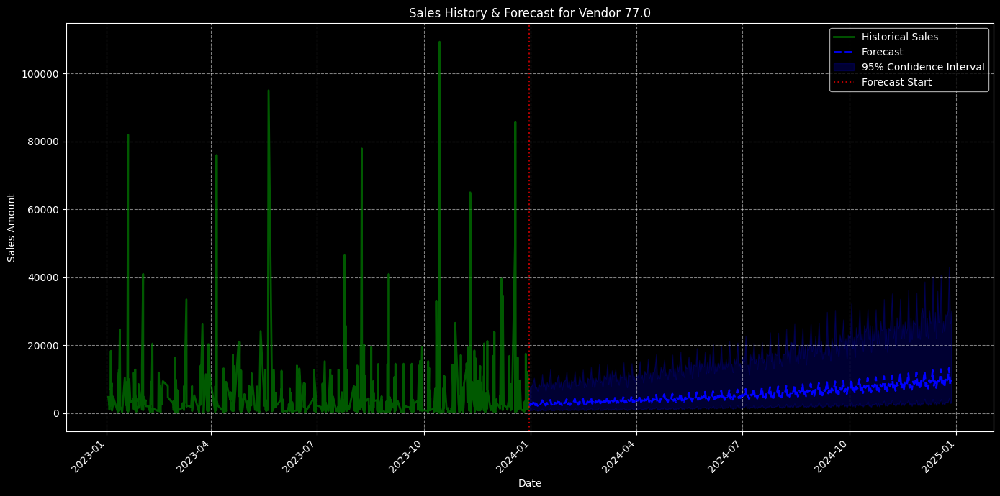

13:30:45 - cmdstanpy - INFO - Chain [1] start processing
13:30:45 - cmdstanpy - INFO - Chain [1] done processing


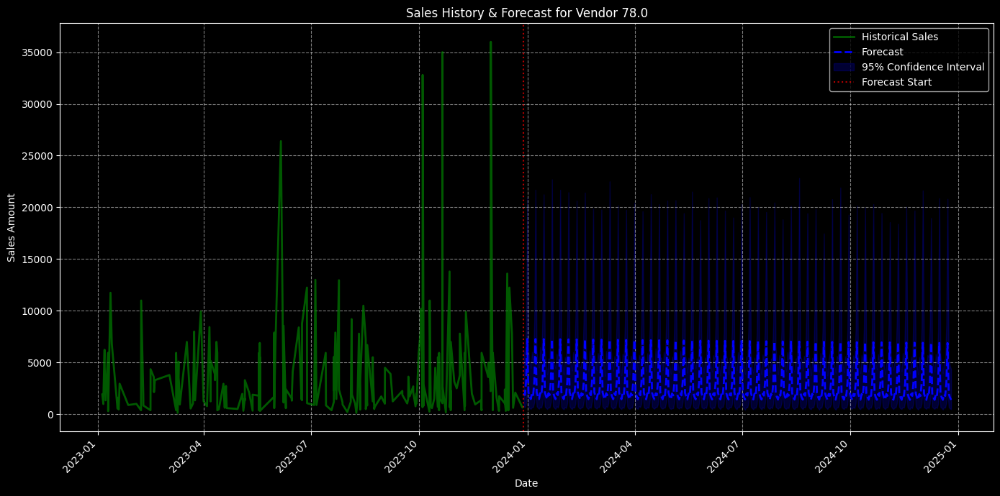

13:30:45 - cmdstanpy - INFO - Chain [1] start processing
13:30:45 - cmdstanpy - INFO - Chain [1] done processing


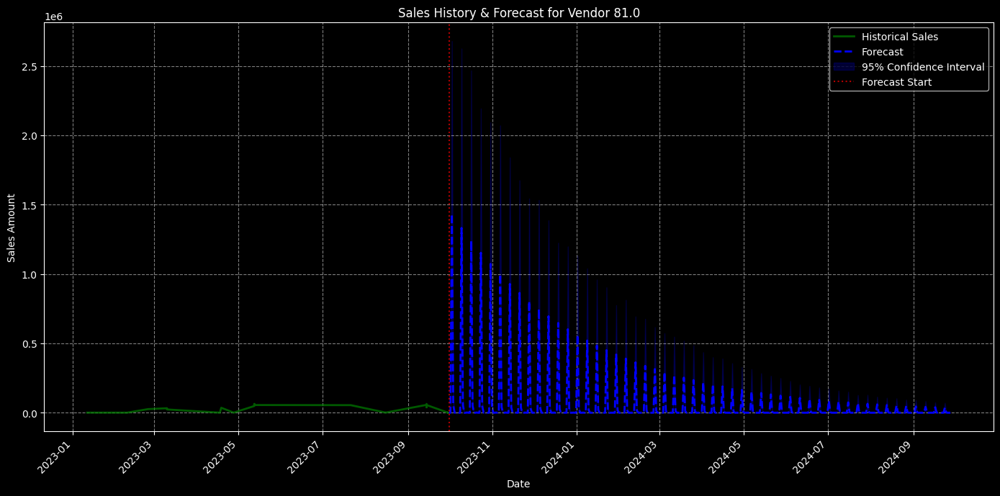

13:30:45 - cmdstanpy - INFO - Chain [1] start processing
13:30:45 - cmdstanpy - INFO - Chain [1] done processing


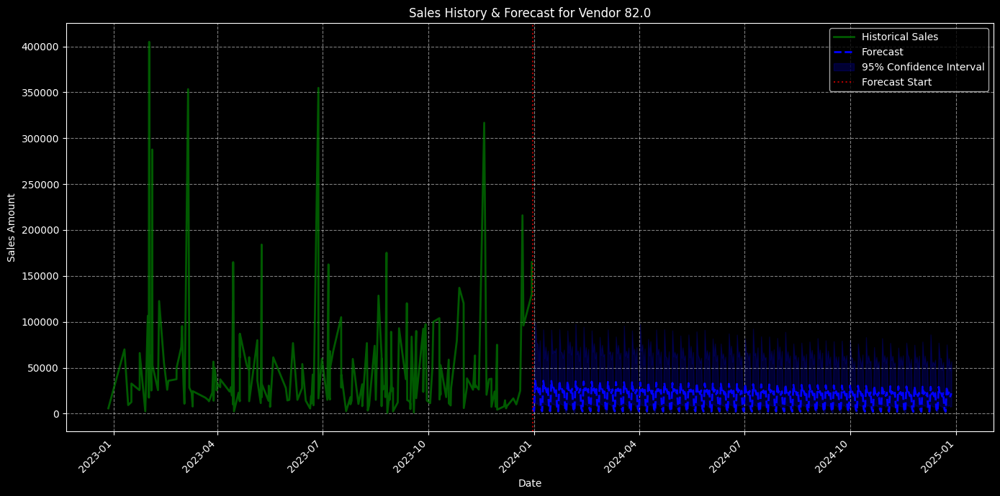

13:30:46 - cmdstanpy - INFO - Chain [1] start processing
13:30:46 - cmdstanpy - INFO - Chain [1] done processing


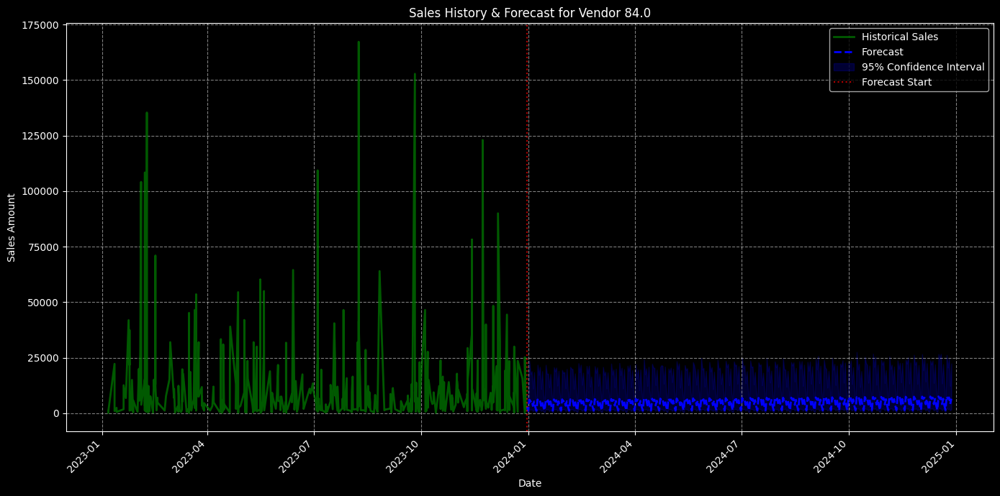

13:30:46 - cmdstanpy - INFO - Chain [1] start processing
13:30:46 - cmdstanpy - INFO - Chain [1] done processing


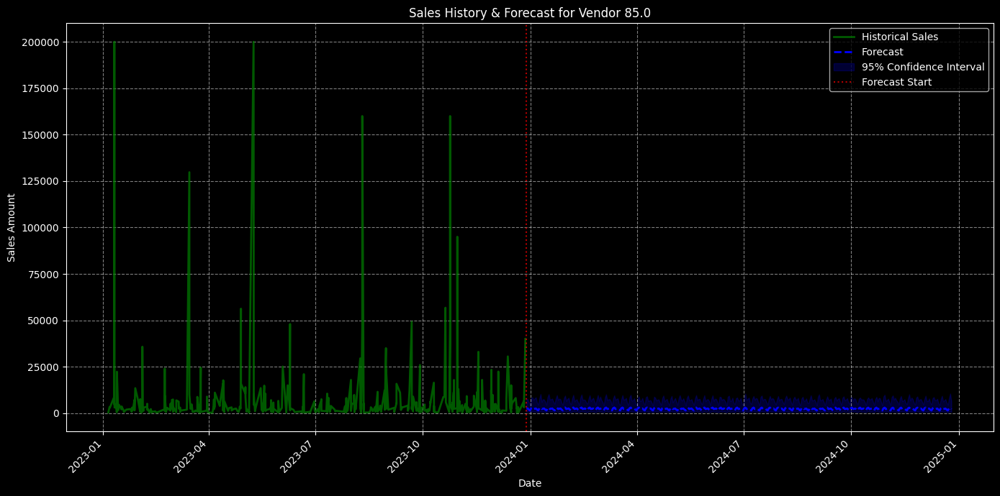

13:30:47 - cmdstanpy - INFO - Chain [1] start processing
13:30:47 - cmdstanpy - INFO - Chain [1] done processing


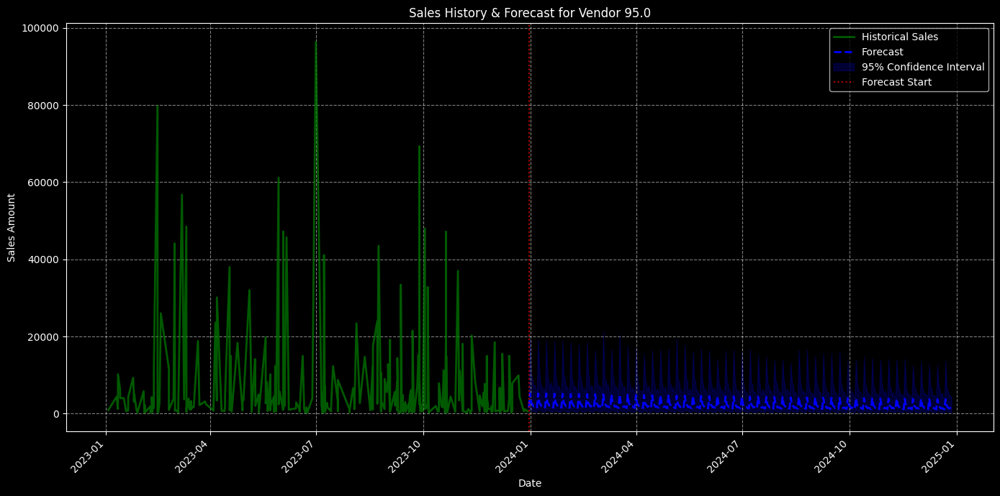

13:30:47 - cmdstanpy - INFO - Chain [1] start processing
13:30:47 - cmdstanpy - INFO - Chain [1] done processing


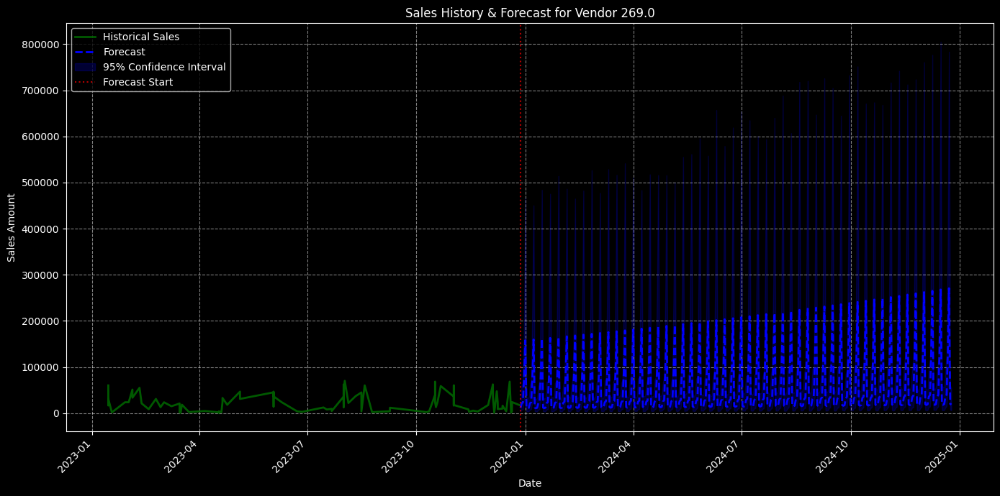

13:30:47 - cmdstanpy - INFO - Chain [1] start processing
13:30:47 - cmdstanpy - INFO - Chain [1] done processing


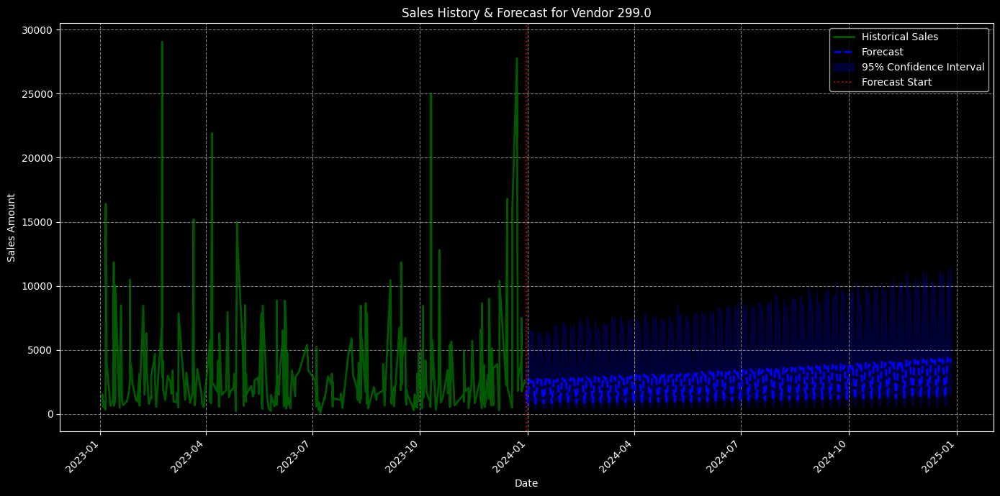

13:30:48 - cmdstanpy - INFO - Chain [1] start processing
13:30:48 - cmdstanpy - INFO - Chain [1] done processing


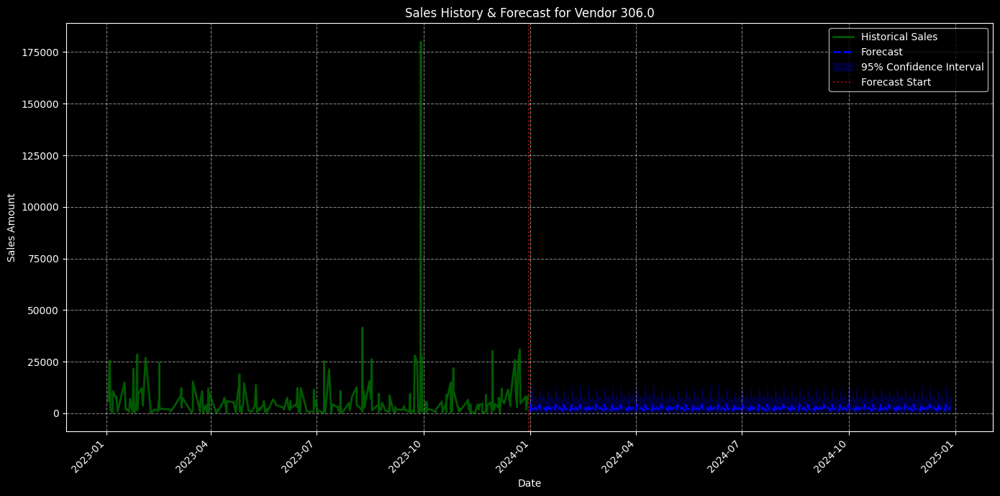

13:30:48 - cmdstanpy - INFO - Chain [1] start processing
13:30:48 - cmdstanpy - INFO - Chain [1] done processing


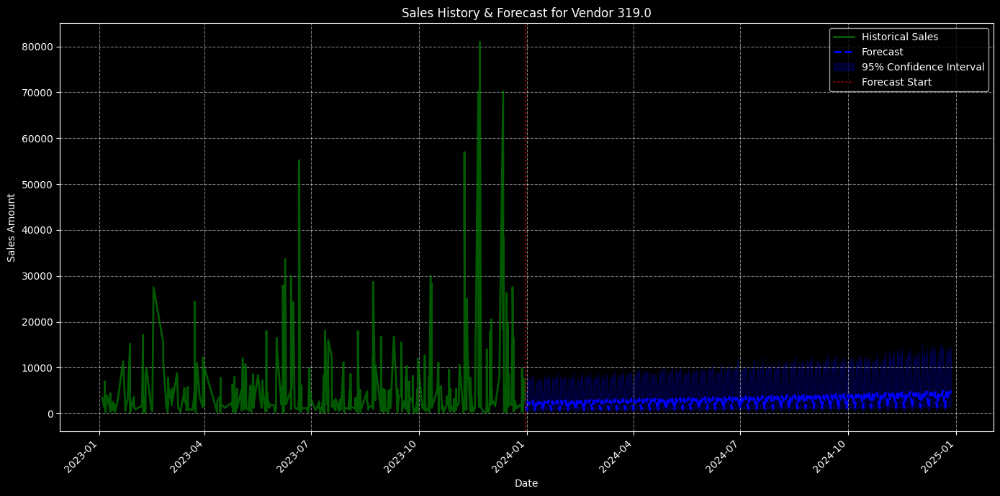

13:30:48 - cmdstanpy - INFO - Chain [1] start processing
13:30:48 - cmdstanpy - INFO - Chain [1] done processing


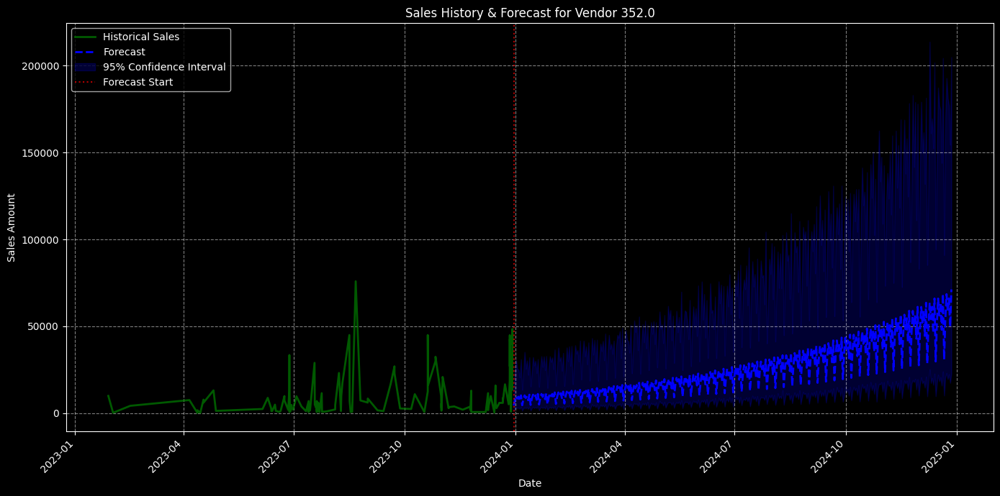

13:30:49 - cmdstanpy - INFO - Chain [1] start processing
13:30:49 - cmdstanpy - INFO - Chain [1] done processing


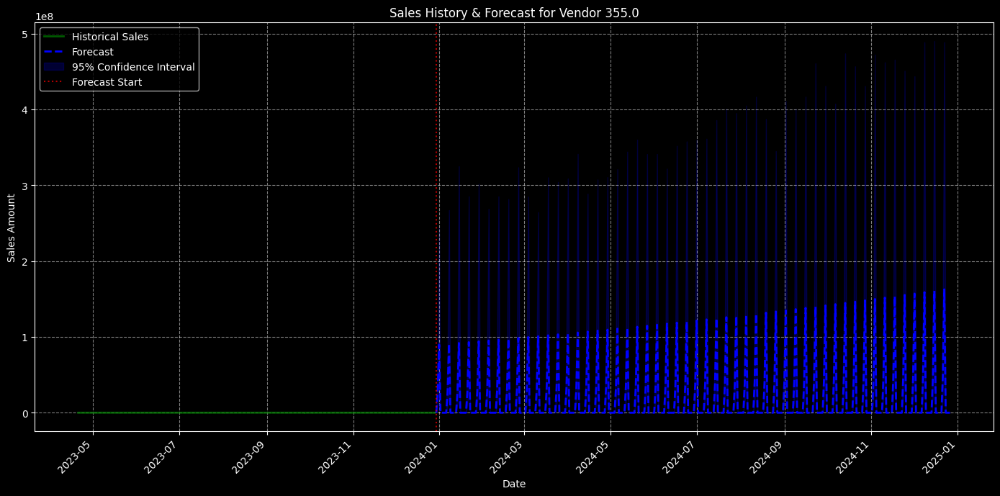

13:30:49 - cmdstanpy - INFO - Chain [1] start processing
13:30:49 - cmdstanpy - INFO - Chain [1] done processing


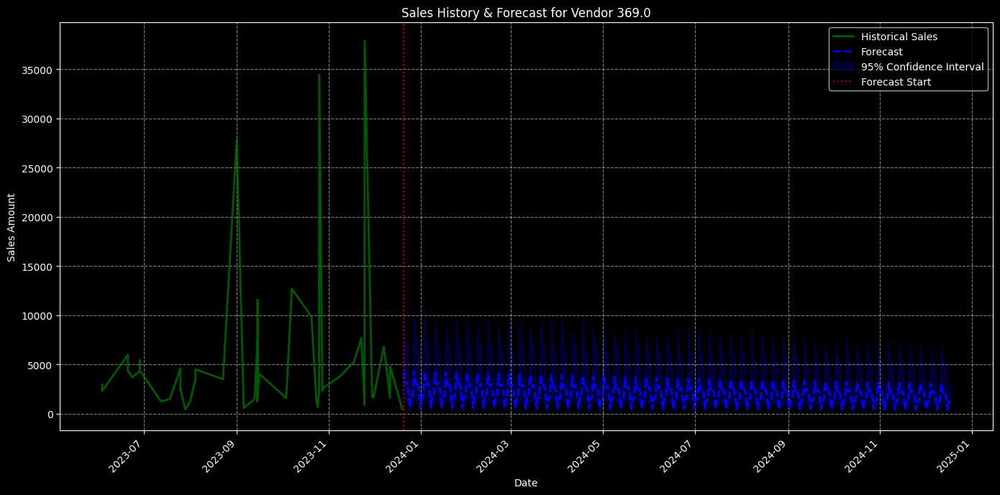

13:30:50 - cmdstanpy - INFO - Chain [1] start processing
13:30:50 - cmdstanpy - INFO - Chain [1] done processing


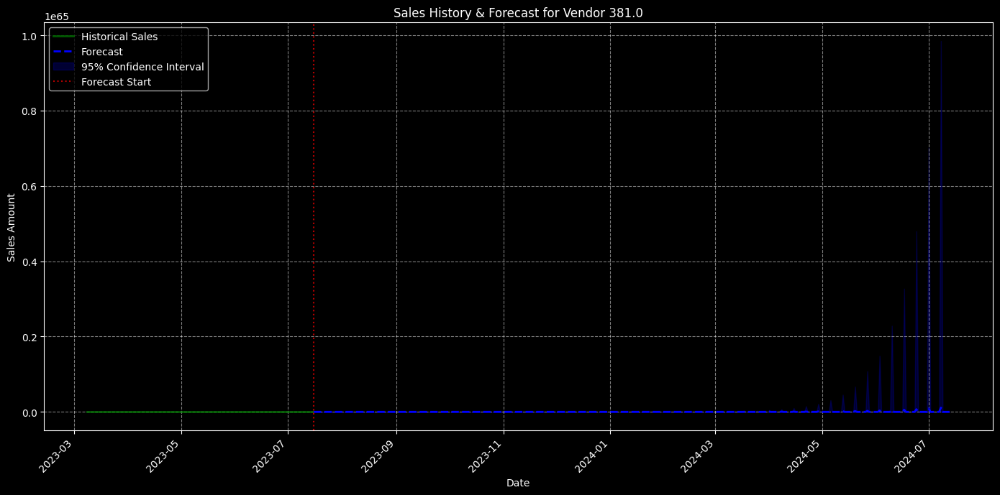

13:30:50 - cmdstanpy - INFO - Chain [1] start processing
13:30:50 - cmdstanpy - INFO - Chain [1] done processing


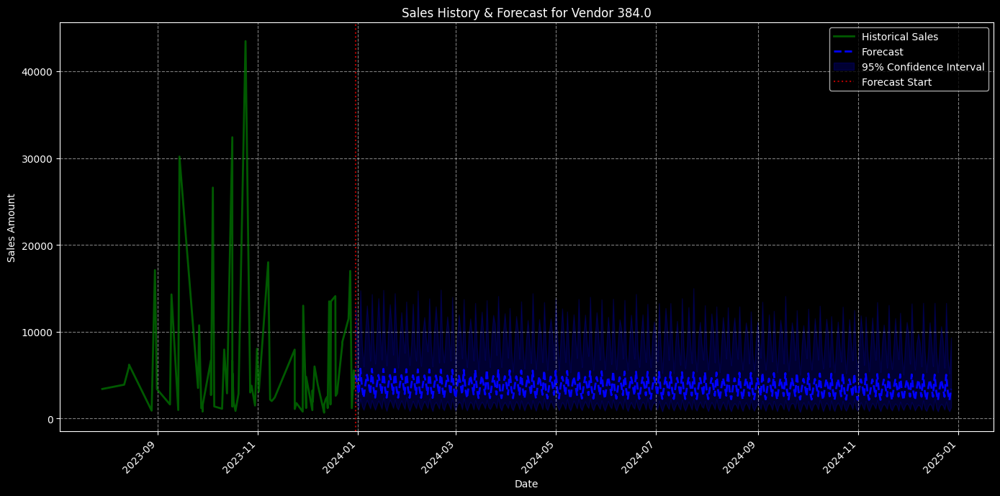

13:30:51 - cmdstanpy - INFO - Chain [1] start processing
13:30:51 - cmdstanpy - INFO - Chain [1] done processing


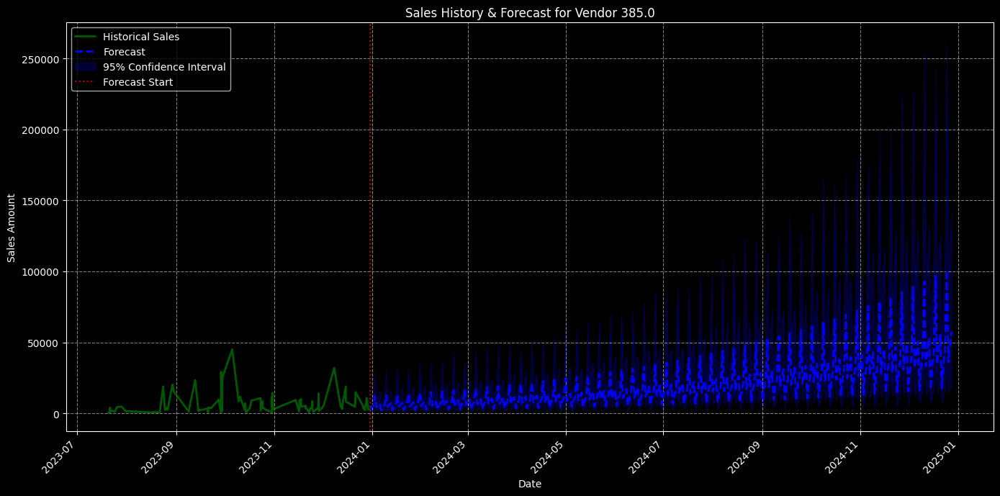

In [24]:
vendor_forecasts = {}
vendor_codes = df.index.get_level_values(0).unique()

for vendor in vendor_codes:
    vendor_data = df.xs(vendor, level=0)
    y = vendor_data['valorVenda']
    forecast = forecast_vendor_sales(y, vendor)

    if forecast is not None:  # Only add successful forecasts
        vendor_forecasts[vendor] = forecast
        plot_vendor_forecast(vendor, y, forecast)

# SKTime with MLFlow

In [ ]:
def forecast_with_mlflow(vendor_df, vendor_id, periods=365):
    """Full MLflow integration with native sktime and pyfunc flavors"""

    predict_conf = {
        "predict_method": {
            "predict": {},
            "predict_interval": {"coverage": [0.8, 0.9]},
            "predict_quantiles": {"quantiles": [0.1, 0.5, 0.9]}
        }
    }

    forecaster = LogTransformer() * Prophet(
        seasonality_mode='additive',
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False
    )

    with mlflow.start_run(run_name=f"vendor_{vendor_id}"):
        fh = ForecastingHorizon(pd.date_range(vendor_df.index[-1], periods=periods, freq='D')[1:])
        forecaster.fit(vendor_df, fh=fh)

        log_model(
            sktime_model=forecaster,
            artifact_path="sktime_model",
            predict_conf=predict_conf
        )

        example_pred = forecaster.predict(fh)
        mlflow.log_dict(
            {"example_prediction": example_pred.to_dict()},
            "predictions.json"
        )

        return forecaster

# Treino/test do forecast

# Plotamos o forecast de cada vendedor

In [25]:
# 1. Your existing forecast function modified to return both
def forecast_vendor_sales(vendor_df, vendor_id, periods=365):
    fh = ForecastingHorizon(pd.date_range(vendor_df.index[-1], periods=periods, freq='D')[1:], is_relative=False)

    forecaster = LogTransformer() * Prophet(
        seasonality_mode='additive',
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False
    )

    forecaster.fit(vendor_df)
    y_pred = forecaster.predict(fh)

    # Create ranking entry with cumulative sum
    combined = pd.concat([vendor_df, y_pred])
    cumulative = combined.cumsum()

    ranking_entry = {
        'vendor': vendor_id,
        'dates': cumulative.index.strftime('%Y-%m-%d').tolist(),
        'cumulative_sales': cumulative.values.tolist(),
        'is_forecast': [False] * len(vendor_df) + [True] * len(y_pred)
    }

    return y_pred, ranking_entry

# 2. Generate forecasts for all vendors
vendor_forecasts = {}
ranking_data = []

for vendor in vendor_codes:
    vendor_data = df.xs(vendor, level=0)
    y = vendor_data['valorVenda']
    forecast, entry = forecast_vendor_sales(y, vendor)
    vendor_forecasts[vendor] = forecast
    ranking_data.append(entry)

# 3. Prepare Highcharts data
def prepare_highcharts_data(ranking_data):
    series = []
    for vendor in ranking_data:
        points = []
        for date_str, value, is_forecast in zip(vendor['dates'],
                                              vendor['cumulative_sales'],
                                              vendor['is_forecast']):
            date = pd.to_datetime(date_str)
            points.append({
                'x': int(date.timestamp() * 1000),
                'y': round(value, 2),
                'isForecast': is_forecast
            })

        series.append({
            'name': vendor['vendor'],
            'data': points,
            'color': '#1E90FF'  # Base color
        })
    return series

chart_series = prepare_highcharts_data(ranking_data)

# 4. Generate HTML with Highcharts
html = f"""
<!DOCTYPE html>
<html>
<head>
    <title>Cumulative Sales Forecast</title>
    <script src="https://code.highcharts.com/highcharts.js"></script>
    <style>
        #chart-container {{
            width: 100%;
            height: 600px;
            margin: 0 auto;
        }}
        .highcharts-credits {{
            display: none;
        }}
    </style>
</head>
<body>
    <div id="chart-container"></div>

    <script>
        const seriesData = {json.dumps(chart_series)};

        Highcharts.chart('chart-container', {{
            chart: {{ type: 'line' }},
            title: {{ text: 'Cumulative Sales (Actual + Forecast)' }},
            subtitle: {{ text: 'Dashed lines indicate forecasted values' }},
            xAxis: {{
                type: 'datetime',
                title: {{ text: 'Date' }},
                crosshair: true
            }},
            yAxis: {{
                title: {{ text: 'Cumulative Sales' }},
                min: 0
            }},
            tooltip: {{
                headerFormat: '<b>{{series.name}}</b><br>',
                pointFormat: '{{point.x:%Y-%m-%d}}: {{{{point.y:,.2f}}}}' +
                    '<span style="color:{{point.color}}">{{{{point.isForecast ? " (Forecast)" : ""}}}}</span>'
            }},
            plotOptions: {{
                series: {{
                    dashStyle: 'Solid',
                    marker: {{ enabled: false }},
                    zones: [
                        {{
                            value: seriesData[0].data.find(p => p.isForecast).x,
                            dashStyle: 'Dash'
                        }}
                    ]
                }}
            }},
            series: seriesData.map(series => ({{
                ...series,
                zoneAxis: 'x',
                zones: [
                    {{
                        value: series.data.find(p => p.isForecast).x,
                        dashStyle: 'Solid',
                        color: series.color
                    }},
                    {{
                        dashStyle: 'Dash',
                        color: series.color
                    }}
                ]
            }}))
        }});
    </script>
</body>
</html>
"""

# Display in Colab
HTML(html)

# Optionally save to file
#from google.colab import files
with open('cumulative_sales.html', 'w') as f:
    f.write(html)
#files.download('cumulative_sales.html')

13:32:15 - cmdstanpy - INFO - Chain [1] start processing
13:32:15 - cmdstanpy - INFO - Chain [1] done processing
13:32:15 - cmdstanpy - INFO - Chain [1] start processing
13:32:15 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1] done processing
13:32:16 - cmdstanpy - INFO - Chain [1] start processing
13:32:16 - cmdstanpy - INFO - Chain [1]

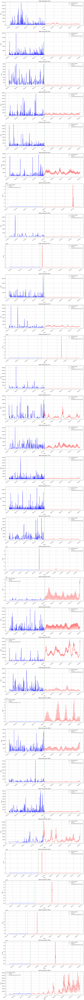

In [ ]:
plot_vendor_forecasts(df, vendor_forecasts)  # Plot all vendors
#plot_vendor_forecasts(df, vendor_forecasts, n_vendors_to_plot=10)  # Plot first 3 vendors

In [ ]:
results = []
for vendor in vendor_forecasts.keys():
    vendor_int = int(vendor)

    try:
        vendor_goal = meta.loc[meta['usuario_sig_id'] == vendor_int, 'venda_valor'].values[0]
        annual_projection = calculate_annual_projection(vendor_forecasts[vendor])

        results.append({
            'vendor_code': vendor,
            'annual_goal': vendor_goal,
            'annual_projection': annual_projection,
            'projection_vs_goal': (annual_projection / vendor_goal) - 1  # Percentage difference
        })
    except:
      pass

performance_df = pd.DataFrame(results)

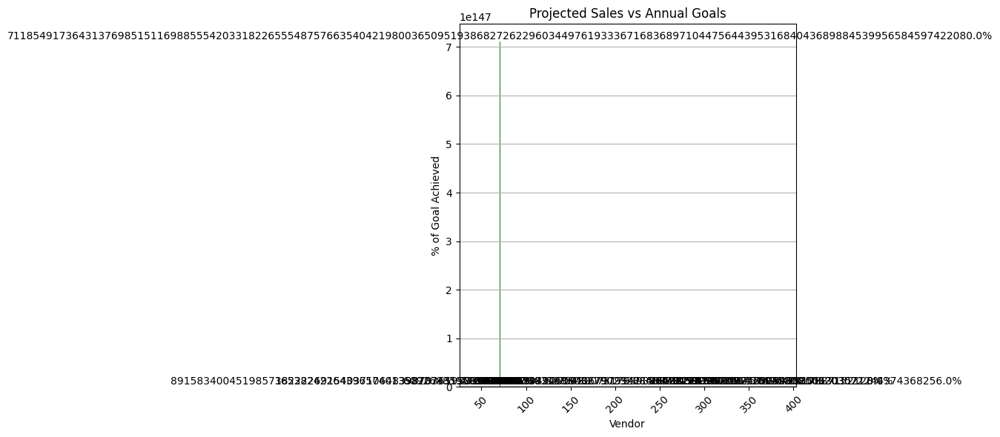

In [ ]:
def plot_goal_achievement(performance_df):
    """Bar chart showing goal achievement percentage"""
    plt.figure(figsize=(12, 6))

    performance_df = performance_df.sort_values('projection_vs_goal', ascending=False)

    bars = plt.bar(performance_df['vendor_code'],
                  performance_df['projection_vs_goal'] * 100,
                  color=np.where(performance_df['projection_vs_goal'] >= 0, 'g', 'r'))

    plt.axhline(y=0, color='k', linestyle='-', linewidth=1)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%',
                ha='center', va='bottom')

    plt.title('Projected Sales vs Annual Goals')
    plt.ylabel('% of Goal Achieved')
    plt.xlabel('Vendor')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

plot_goal_achievement(performance_df)

<ipython-input-33-18a335494061>:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  final_diff = cumulative_forecast[-1] - annual_goal
<ipython-input-33-18a335494061>:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  xy=(cumulative_forecast.index[-1], cumulative_forecast[-1]),


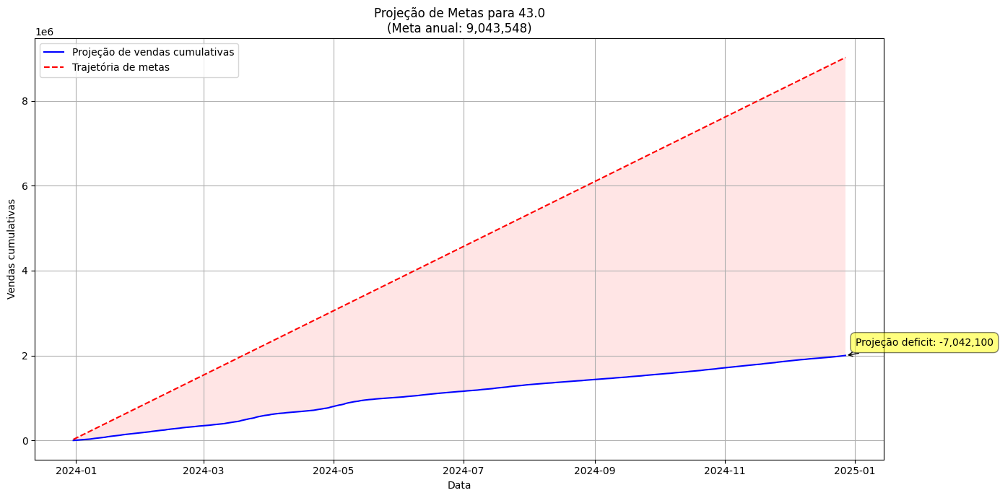

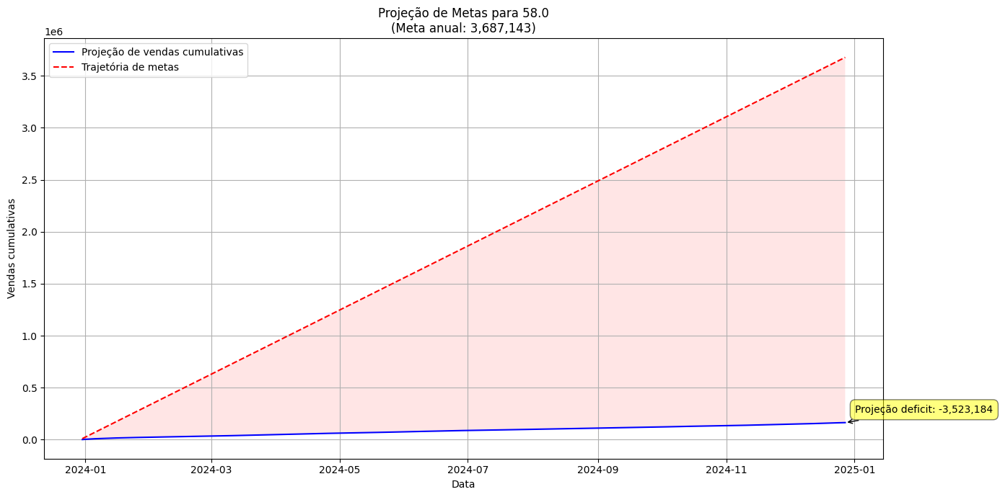

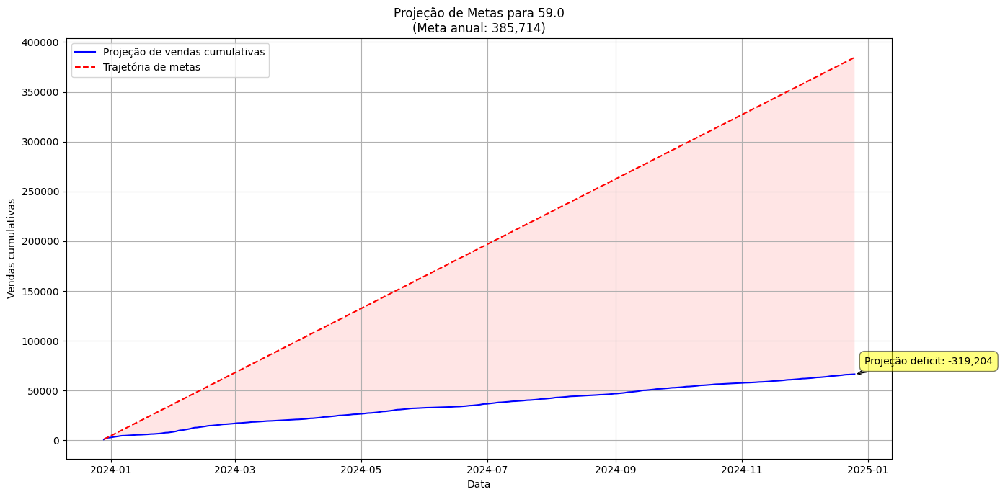

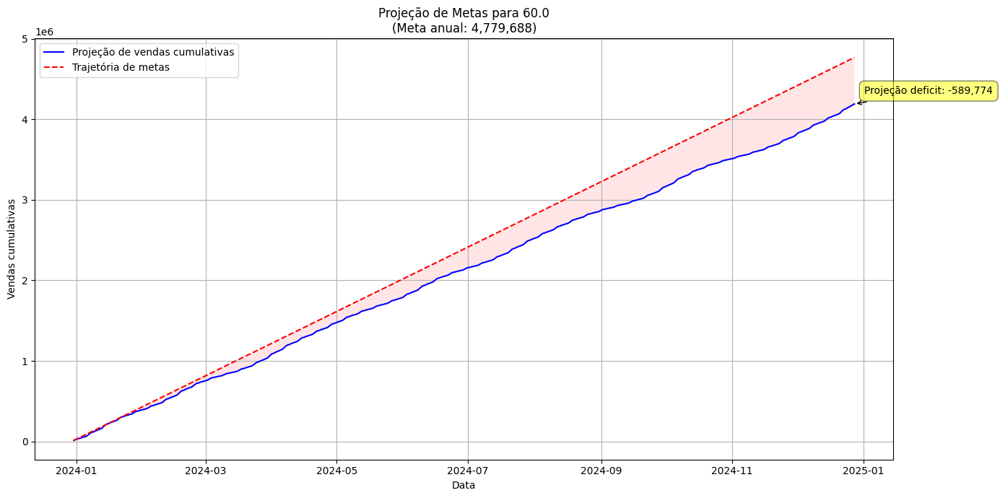

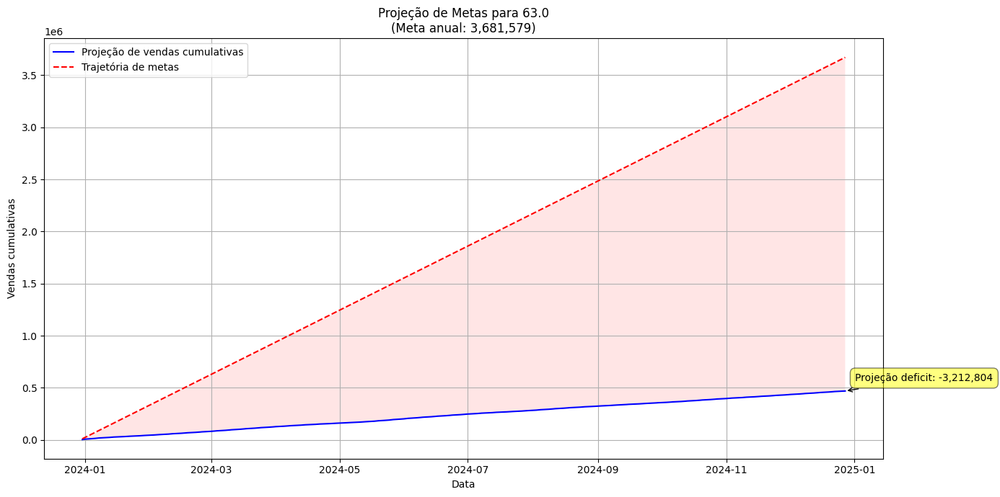

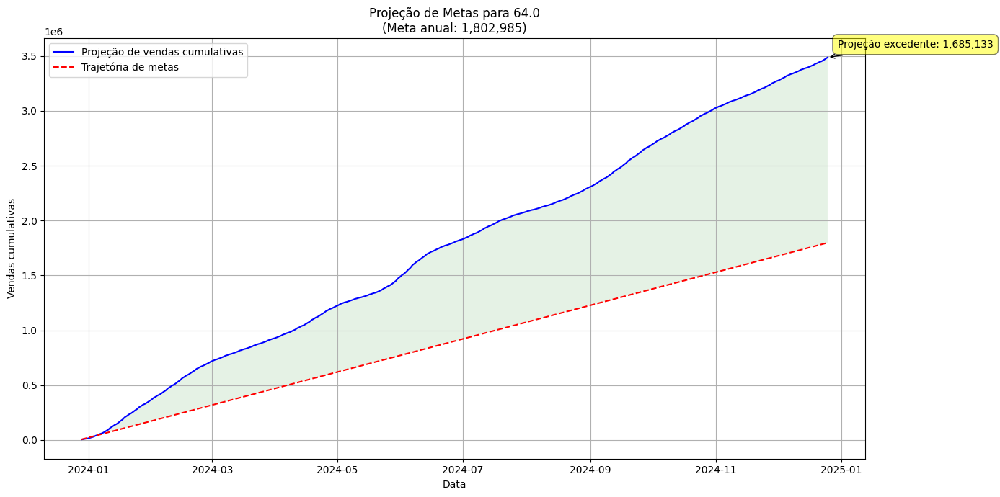

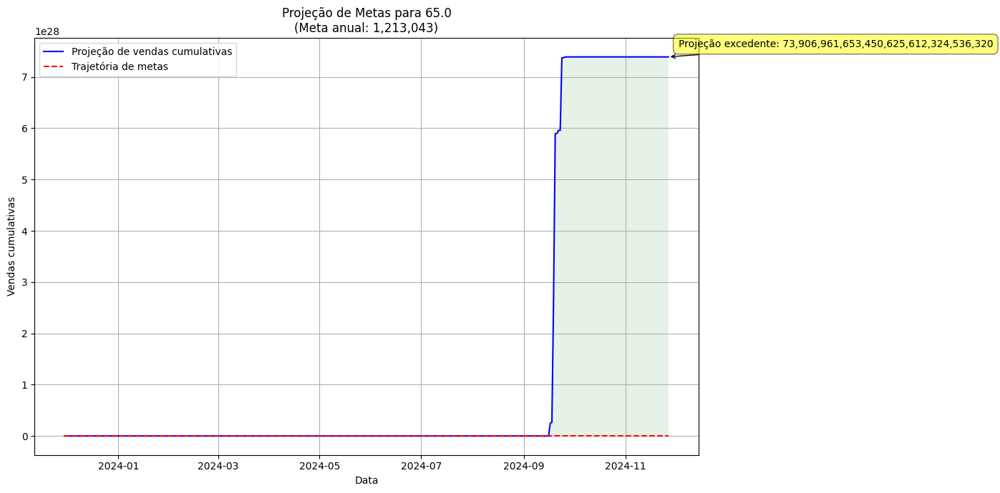

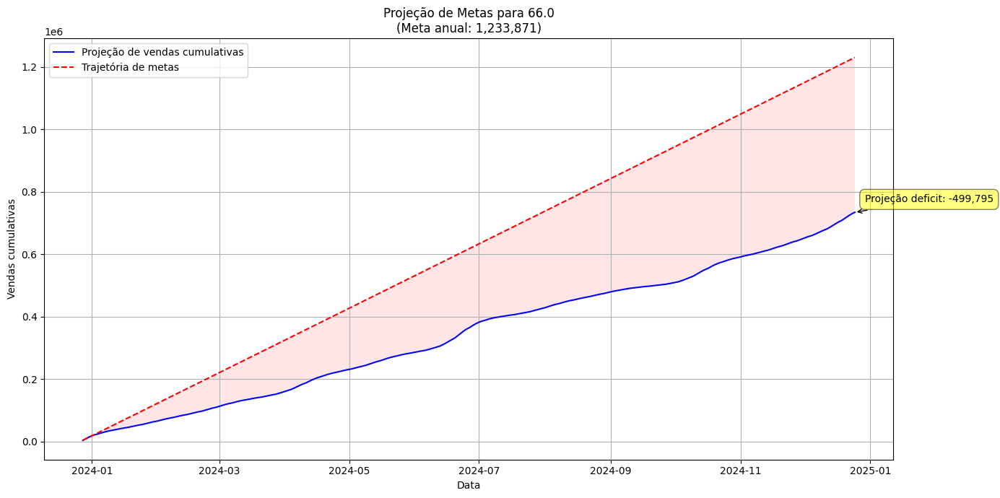

In [ ]:
for vendor in list(vendor_forecasts.keys())[:8]:
    plot_forecast_vs_goal(df, vendor_forecasts, meta, vendor)

# Salvamos os forecasts em Excel

In [ ]:
forecast_df = pd.concat(vendor_forecasts, axis=1)
forecast_df.columns = forecast_df.columns.droplevel(1)  # Clean up multiindex

# Save to CSV
forecast_df.to_csv('vendor_sales_forecasts.csv')

# Or analyze individual vendors
print(forecast_df.head())